# Minichallenge 1

Hinweis:
Das ganze Notebook wurde mit ChatGPT und Copilot bearbeitet.

#### import Librarys

In [30]:
import numpy as np
import pandas as pd
from PIL import Image, ImageEnhance
from skimage import io, img_as_float, color
from skimage.restoration import denoise_wavelet

from glob import glob

import cv2
import matplotlib.pyplot as plt

# 1. Grundlagen Bild- und Signalverarbeitung (LE1)

## Attribute der Bilder Kontrast, Farbsättigung und Rauschen

### 1.1 Bildeigenschaften

Suche verschiedene Bilder unterschiedlicher Szenen passend zu deinem Land oder nehme selbst welche auf. Die Bilder sollen sich eignen, um Anpassungen der Bildeigenschaften {'Kontrast, Farbsättigung, Rauschen'} in Experimenten zu demonstrieren. Messe dazu zuerst auf deinen Bildern die dir zugeordneten Bildeigenschaften mittels geeigneten Metriken. Definiere danach ein Ziel, wie die dir zugeordneten Bildeigenschaften verändert werden sollen. Definiere ein paar Experimente, um dieses Ziel zu erreichen, und führe die Experimente mit deinen Bildern und geeigneten Methoden aus. Analysiere die Histogramme der ursprünglichen Bilder und während deinen Experimenten. Führe ggf. eine Histogramm-Entzerrung (Englisch: histogram equalization) durch. Diskutiere deine Daten-, Parameter- und Methodenwahl und die erzielten Ergebnisse. 

In [31]:
# load images
image_files = glob('images/*.jpg')

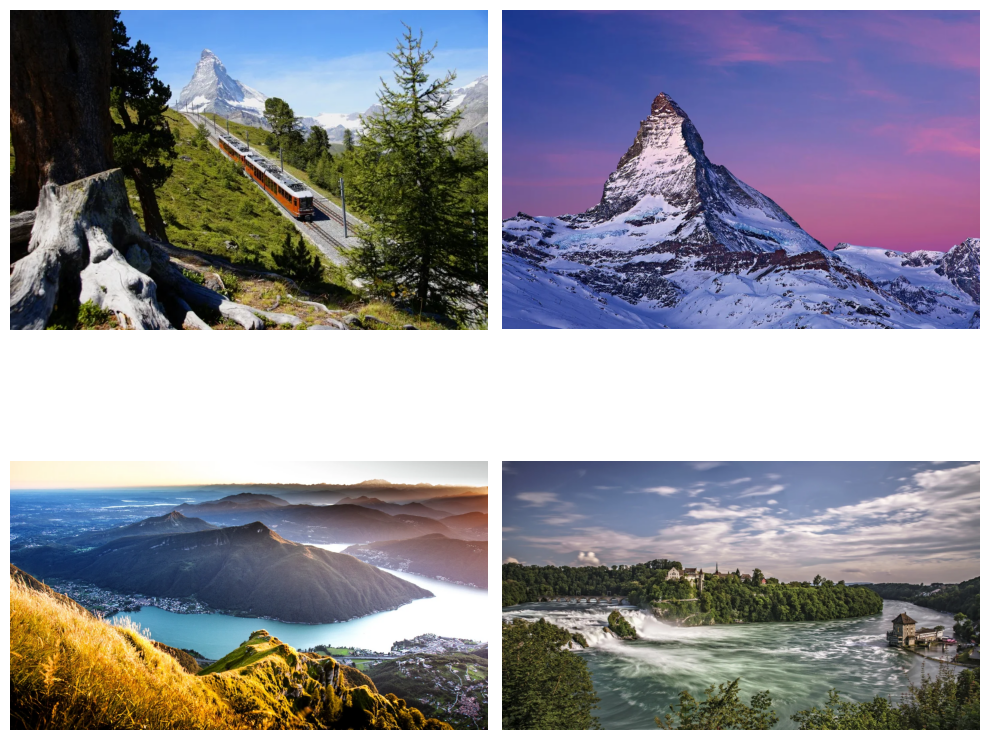

In [32]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for idx, image_file in enumerate(image_files):
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Determine the row and column for the current image
    row = idx // 2
    col = idx % 2
    
    axes[row, col].imshow(image)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


In [33]:
img_mpl = plt.imread(image_files[0])
img_cv2 = cv2.imread(image_files[0])
img_mpl_1 = plt.imread(image_files[1])
img_cv2_1 = cv2.imread(image_files[1])
img_mpl_2 = plt.imread(image_files[2])
img_cv2_2 = cv2.imread(image_files[2])
img_mpl_3 = plt.imread(image_files[3])
img_cv2_3 = cv2.imread(image_files[3])

In [34]:
# function to compute the standard deviation of the pixel values of an image
def compute_std(image):
    return np.std(image)

In [35]:
def compute_std_gray(image_path):
    # Open the image using PIL
    img = Image.open(image_path)
    
    # Convert the image to grayscale (optional, but ensures a single channel)
    img_gray = img.convert('L')
    
    # Convert the image data to a numpy array
    img_array = np.array(img_gray)
    
    # Compute the standard deviation of the pixel values
    std_dev = np.std(img_array)
    
    return std_dev

In [36]:
# convert images to grayscale
img_mpl_gray = cv2.cvtColor(img_mpl, cv2.COLOR_BGR2GRAY)
img_mpl_1_gray = cv2.cvtColor(img_mpl_1, cv2.COLOR_BGR2GRAY)
img_mpl_2_gray = cv2.cvtColor(img_mpl_2, cv2.COLOR_BGR2GRAY)
img_mpl_3_gray = cv2.cvtColor(img_mpl_3, cv2.COLOR_BGR2GRAY)

## Kontrast

### Histogramme der Kontraste der Bilder

In [37]:
def display_image_and_histogram(image_path):
    # Bild öffnen und in Graustufen konvertieren
    bild = Image.open(image_path).convert('L')

    # Pixelwerte in eine Liste konvertieren
    pixelwerte = list(bild.getdata())

    # Erstellen Sie eine Figur mit zwei benachbarten Plots
    plt.figure(figsize=(12, 4))

    # Originalbild anzeigen
    plt.subplot(1, 2, 1)
    plt.imshow(bild, cmap='gray')
    plt.title('Originalbild')
    plt.axis('off')  # Achsen ausschalten

    # Histogramm erstellen
    plt.subplot(1, 2, 2)
    plt.hist(pixelwerte, bins=256, color='gray', alpha=0.7)
    plt.title('Histogramm der Intensitätswerte')
    plt.xlabel('Intensität')
    plt.ylabel('Anzahl der Pixel')
    plt.xlim([0, 256])

    plt.tight_layout()  # Stellt sicher, dass die Plots nicht überlappen
    plt.show()

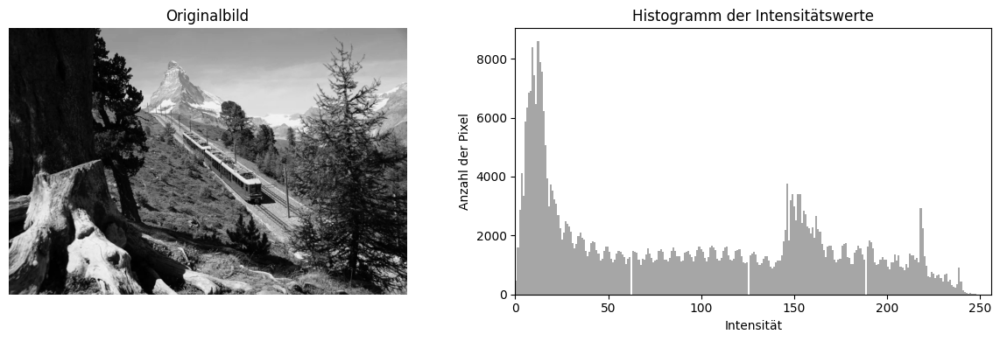

In [38]:
display_image_and_histogram(image_files[0])

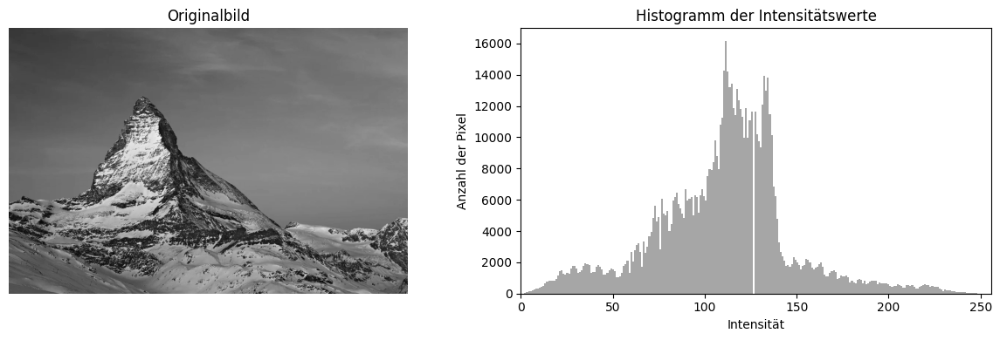

In [39]:
display_image_and_histogram(image_files[1])

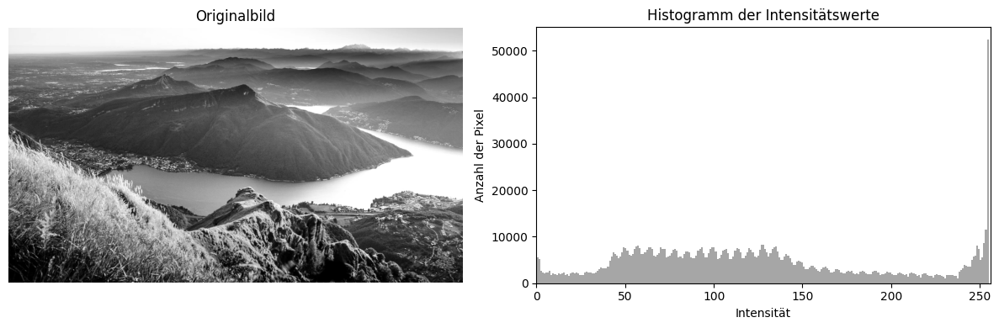

In [40]:
display_image_and_histogram(image_files[2])

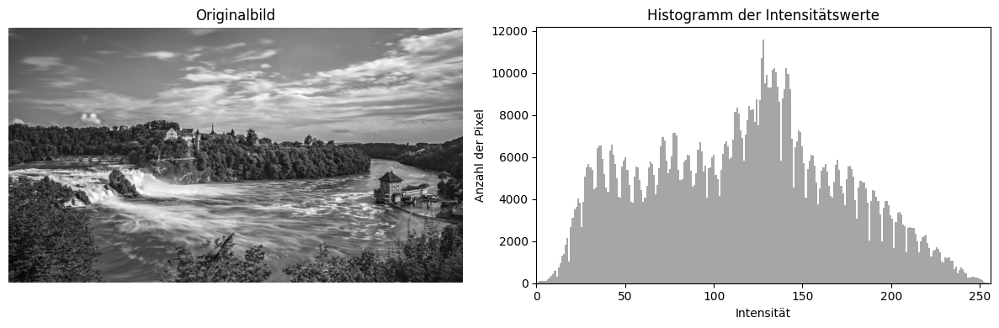

In [41]:
display_image_and_histogram(image_files[3])

### Experimente mit Kontrast

In [42]:
def change_contrast(img_path, output_path, factor):
    """
    Ändert den Kontrast des Bildes.
    
    :param img_path: Pfad zum Originalbild
    :param output_path: Pfad zum Speichern des bearbeiteten Bildes
    :param factor: Kontrastfaktor (1.0 = Originalbild, < 1.0 = weniger Kontrast, > 1.0 = mehr Kontrast)
    """
    # Bild öffnen
    img = Image.open(img_path)
    
    # änderung des Kontrastes
    enhancer = ImageEnhance.Contrast(img)
    img_enhanced = enhancer.enhance(factor)
    
    # Bild speichern
    img_enhanced.save(output_path)

In [43]:
# erstes Bild
change_contrast(image_files[0], 'images/Contrast/matterhornMitZug_contrast_0.5.jpg', 0.5)
change_contrast(image_files[0], 'images/Contrast/matterhornMitZug_contrast_0.1.jpg', 0.1)
change_contrast(image_files[0], 'images/Contrast/matterhornMitZug_contrast_1.5.jpg', 1.5)

#zweites Bild
change_contrast(image_files[1], 'images/Contrast/matterhorn_contrast_0.8.jpg', 0.8)
change_contrast(image_files[1], 'images/Contrast/matterhorn_contrast_0.2.jpg', 0.2)
change_contrast(image_files[1], 'images/Contrast/matterhorn_contrast_1.7.jpg', 1.7)

# drittes Bild
change_contrast(image_files[2], 'images/Contrast/MonteSanGiorgio_contrast_0.7.jpg', 0.7)
change_contrast(image_files[2], 'images/Contrast/MonteSanGiorgio_contrast_0.3.jpg', 0.3)
change_contrast(image_files[2], 'images/Contrast/MonteSanGiorgio_contrast_1.2.jpg', 1.2)

In [44]:
edited_images_contrast = glob('images/Contrast/*.jpg')

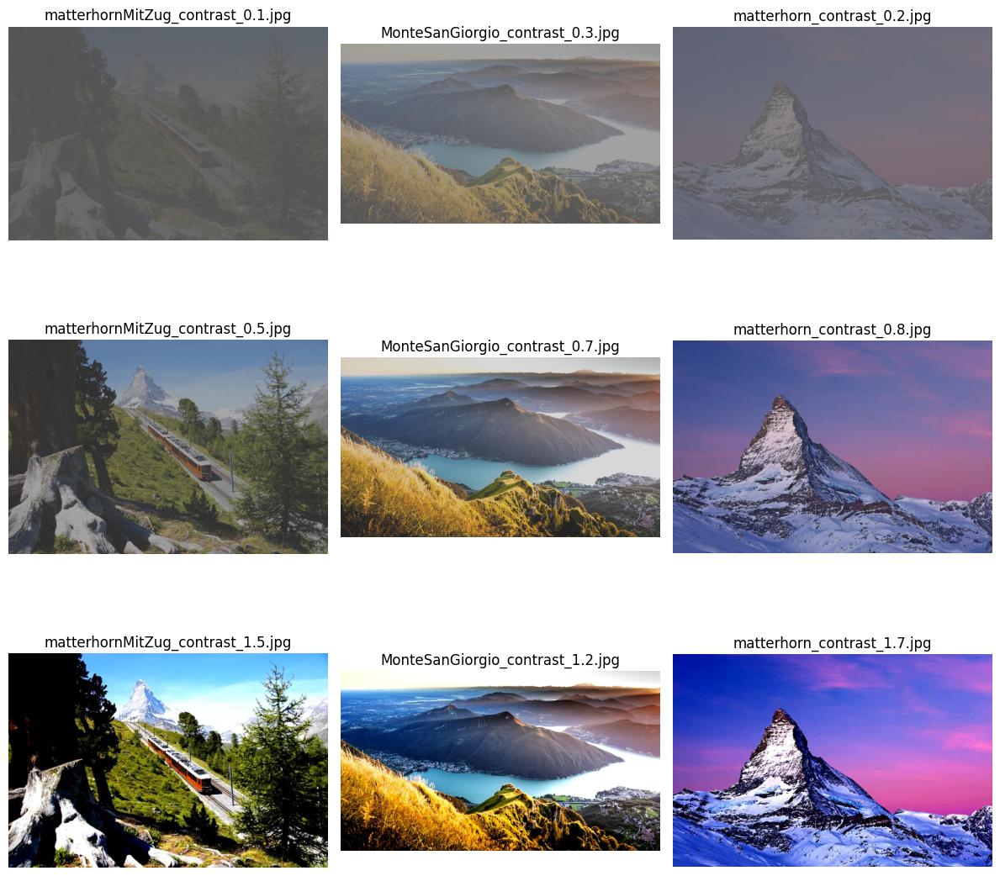

In [45]:
plt.figure(figsize=(12, 12))
# Bilder in Gruppen basierend auf dem Namen vor dem "_contrast_" organisieren
image_groups = {}
for img_path in edited_images_contrast:
    base_name = img_path.split('_contrast_')[0].split('/')[-1]  # z.B. "matterhornMitZug"
    if base_name not in image_groups:
        image_groups[base_name] = []
    image_groups[base_name].append(img_path)

# Bilder in der gewünschten Reihenfolge plotten
col = 0
for base_name, img_paths in image_groups.items():
    # Bilder innerhalb jeder Gruppe basierend auf dem Kontrastwert sortieren
    sorted_img_paths = sorted(img_paths, key=lambda x: float(x.split('_contrast_')[1].split('.jpg')[0]))
    for row, img_path in enumerate(sorted_img_paths):
        img = Image.open(img_path)
        plt.subplot(3, 3, row * 3 + col + 1)
        plt.imshow(img)
        plt.title(img_path.split('/')[-1])  # Nur den Dateinamen anzeigen
        plt.axis('off')  # Achsen abschalten
    col += 1

# Gesamten Plot anzeigen
plt.tight_layout()
plt.show()

### Rauschen der Bilder

In [46]:
def display_original_and_difference(image_path):
    # Bild laden und in Graustufen konvertieren
    bild = img_as_float(io.imread(image_path, as_gray=True))

    # Denoisierte Version des Bildes erstellen
    denoised_bild = denoise_wavelet(bild)

    # Subtrahieren Sie die denoisierte Version vom Original
    difference = bild - denoised_bild

    # Standardabweichung des Unterschiedsbildes berechnen
    std_dev = np.std(difference)

    print(f"Standardabweichung des Unterschiedsbildes: {std_dev:.4f}")

    # Erstellen Sie eine Figur mit zwei benachbarten Plots
    plt.figure(figsize=(12, 4))

    # Originalbild anzeigen
    plt.subplot(1, 2, 1)
    plt.imshow(bild, cmap='gray')
    plt.title('Originalbild')
    plt.axis('off')  # Achsen ausschalten

    # Unterschiedsbild anzeigen
    plt.subplot(1, 2, 2)
    plt.imshow(difference, cmap='gray')
    plt.colorbar()
    plt.title('Unterschiedsbild')
    plt.axis('off')  # Achsen ausschalten

    plt.tight_layout()  # Stellt sicher, dass die Plots nicht überlappen
    plt.show()

Standardabweichung des Unterschiedsbildes: 0.0067


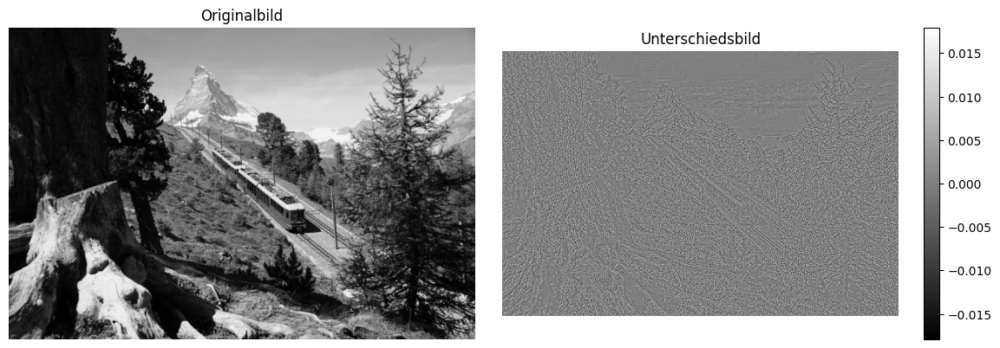

In [47]:
display_original_and_difference(image_files[0])

Standardabweichung des Unterschiedsbildes: 0.0062


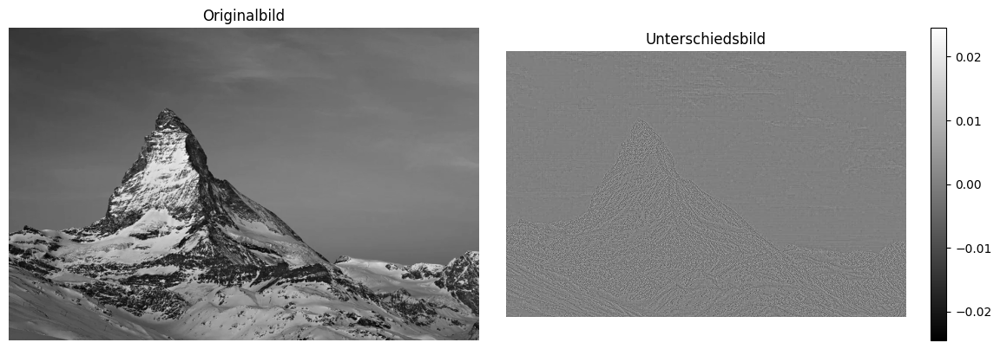

In [48]:
display_original_and_difference(image_files[1])

Standardabweichung des Unterschiedsbildes: 0.0038


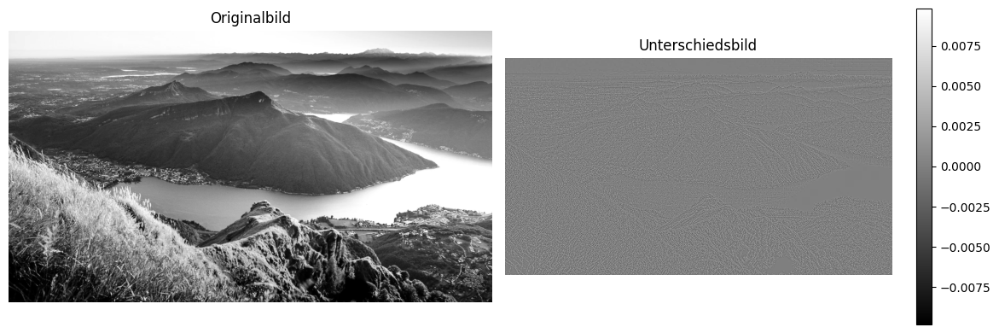

In [49]:
display_original_and_difference(image_files[2])

Standardabweichung des Unterschiedsbildes: 0.0016


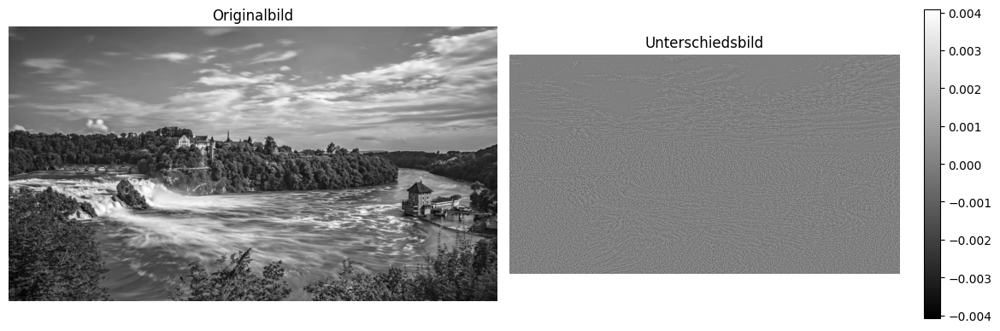

In [50]:
display_original_and_difference(image_files[3])

## Experimente mit Rauschen

In [51]:
def add_gaussian_noise(image, mean=0, sigma=25):
    """Fügt einem Bild Gaußsches Rauschen hinzu."""
    row, col, ch = image.shape
    gauss = np.random.normal(mean, sigma, (row, col, ch))
    noisy = np.clip(image + gauss, 0, 255)
    return noisy.astype(np.uint8)

In [52]:
def show_original_and_noisy(original, noisy):
    
    plt.figure(figsize=(10, 5))

    # Originalbild anzeigen
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title('Originalbild')
    plt.axis('off')

    # Verrauschtes Bild anzeigen
    plt.subplot(1, 2, 2)
    plt.imshow(noisy)
    plt.title('Bild mit Gaußschem Rauschen')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

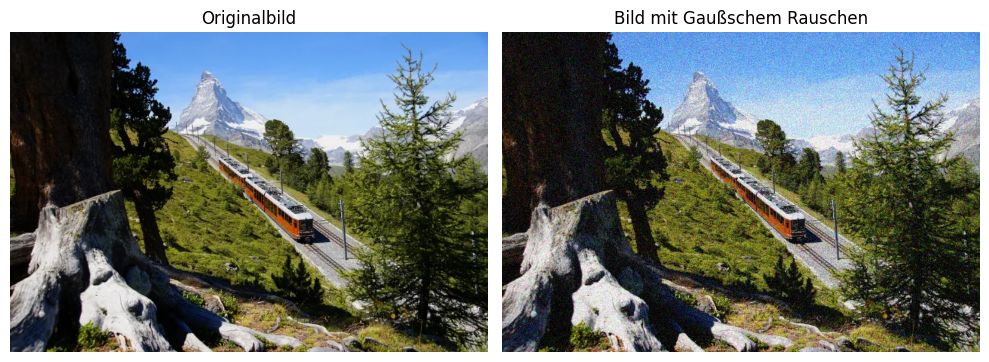

In [53]:
img = Image.open(image_files[0])
img_array = np.array(img)
noisy_img = add_gaussian_noise(img_array)
show_original_and_noisy(img_array, noisy_img)

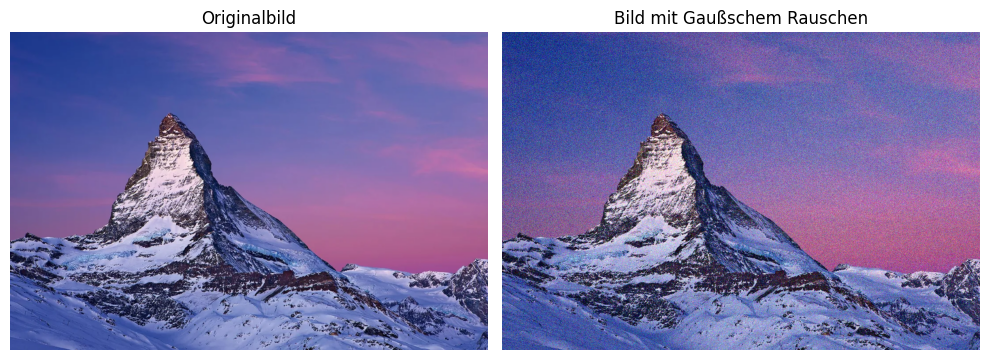

In [54]:
img = Image.open(image_files[1])
img_array = np.array(img)
noisy_img = add_gaussian_noise(img_array)
show_original_and_noisy(img_array, noisy_img)

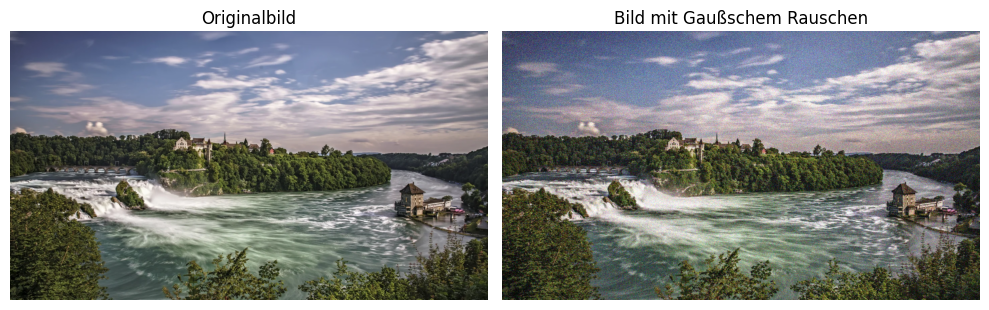

In [55]:
img = Image.open(image_files[3])
img_array = np.array(img)
noisy_img = add_gaussian_noise(img_array)
show_original_and_noisy(img_array, noisy_img)

### Farbsättigung ermittelt mit der Standardabweichung der Pixelwerte

In [56]:
def compute_std_hsv(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to HSV color space
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # Compute the standard deviation for each channel: Hue, Saturation, and Value
    std_hue = np.std(hsv_image[:,:,0])
    std_saturation = np.std(hsv_image[:,:,1])
    std_value = np.std(hsv_image[:,:,2])
    
    return std_hue, std_saturation, std_value

In [57]:
def image_saturation(image_path):
    bild = img_as_float(io.imread(image_path))
    std_hue, std_saturation, std_value = compute_std_hsv(image_path)  # Verwenden Sie image_path anstelle von image_files[0]
    
    plt.imshow(bild)
    plt.axis('off')
    
    # Text neben dem Bild anzeigen
    title_text = (
        f"std_hue: {std_hue:.4f}\n"
        f"std_saturation: {std_saturation:.4f}\n"
        f"std_value: {std_value:.4f}"
    )
    plt.text(bild.shape[1] + 10, bild.shape[0] / 2, title_text, verticalalignment='center')
    
    plt.show()

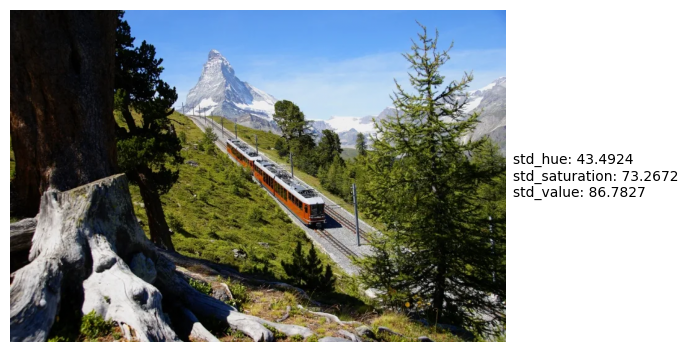

In [58]:
image_saturation(image_files[0])

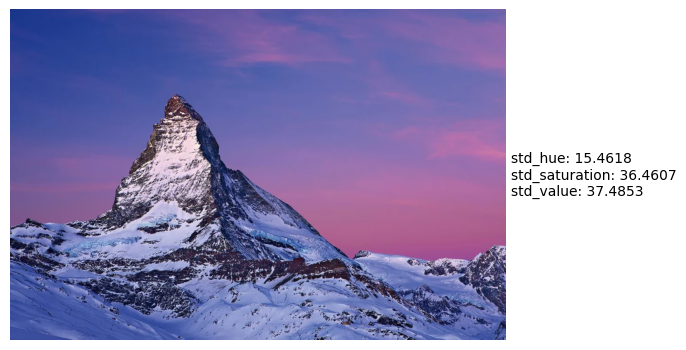

In [59]:
image_saturation(image_files[1])

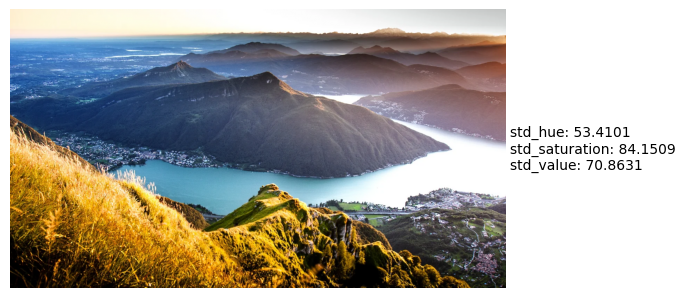

In [60]:
image_saturation(image_files[2])

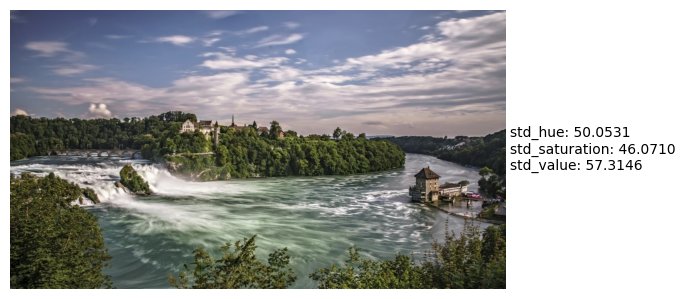

In [61]:
image_saturation(image_files[3])

## Experimente mit Farbsättigung

In [62]:
def adjust_saturation(image_path, output_path, factor):
    try:
        # Öffnen Sie das Bild
        image = Image.open(image_path)

        # Passen Sie die Farbsättigung an
        enhancer = ImageEnhance.Color(image)
        adjusted_image = enhancer.enhance(factor)

        # Speichern Sie das bearbeitete Bild
        adjusted_image.save(output_path)

        print(f"Farbsättigung geändert und gespeichert in: {output_path}")
    except Exception as e:
        print(f"Fehler beim Bearbeiten des Bildes: {str(e)}")

In [63]:
# Bilder mit veränderten Werten speichern

# Matterhorn mit Zug
adjust_saturation(image_files[0], 'images/Saturation/matterhornmitzug_saturation_2.3.jpg', 2.3)
adjust_saturation(image_files[0], 'images/Saturation/matterhornmitzug_saturation_0.1.jpg', 0.1)

# Matterhorn
adjust_saturation(image_files[1], 'images/Saturation/matterhorn_saturation_1.5.jpg', 1.5)
adjust_saturation(image_files[1], 'images/Saturation/matterhorn_saturation_0.2.jpg', 0.2)

# Monte San Giorgio
adjust_saturation(image_files[2], 'images/Saturation/montesangiorgio_saturation_2.9.jpg', 2.9)
adjust_saturation(image_files[2], 'images/Saturation/montesangiorgio_saturation_0.7.jpg', 0.7)

Farbsättigung geändert und gespeichert in: images/Saturation/matterhornmitzug_saturation_2.3.jpg
Farbsättigung geändert und gespeichert in: images/Saturation/matterhornmitzug_saturation_0.1.jpg
Farbsättigung geändert und gespeichert in: images/Saturation/matterhorn_saturation_1.5.jpg
Farbsättigung geändert und gespeichert in: images/Saturation/matterhorn_saturation_0.2.jpg
Farbsättigung geändert und gespeichert in: images/Saturation/montesangiorgio_saturation_2.9.jpg
Farbsättigung geändert und gespeichert in: images/Saturation/montesangiorgio_saturation_0.7.jpg


In [64]:
edited_images_saturation = glob('images/Saturation/*.jpg')

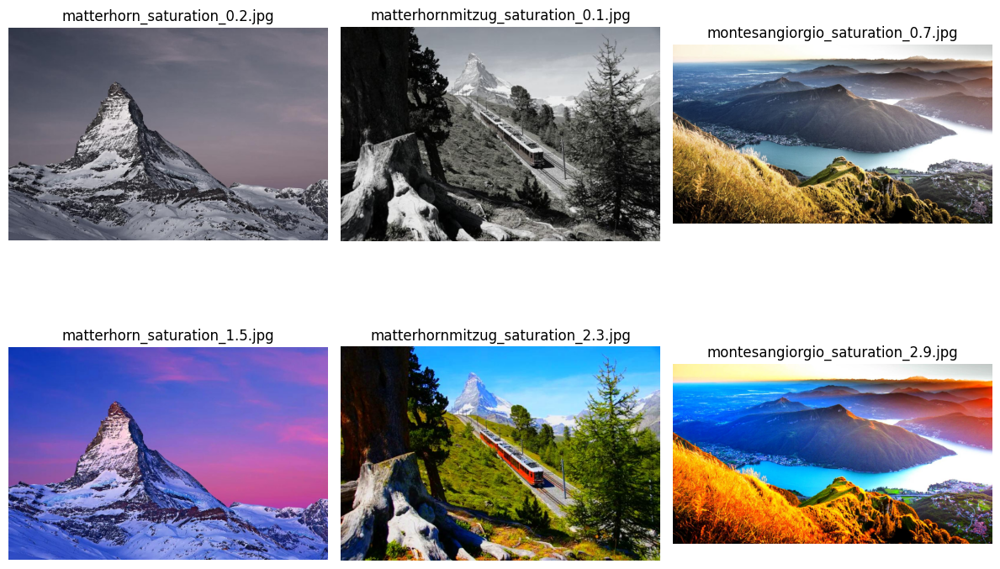

In [65]:
plt.figure(figsize=(12, 12))
# Bilder in Gruppen basierend auf dem Namen vor dem "_contrast_" organisieren
image_groups = {}
for img_path in edited_images_saturation:
    base_name = img_path.split('_saturation_')[0].split('/')[-1]  # z.B. "matterhornMitZug"
    if base_name not in image_groups:
        image_groups[base_name] = []
    image_groups[base_name].append(img_path)

# Bilder in der gewünschten Reihenfolge plotten
col = 0
for base_name, img_paths in image_groups.items():
    # Bilder innerhalb jeder Gruppe basierend auf dem Kontrastwert sortieren
    sorted_img_paths = sorted(img_paths, key=lambda x: float(x.split('_saturation_')[1].split('.jpg')[0]))
    for row, img_path in enumerate(sorted_img_paths):
        img = Image.open(img_path)
        plt.subplot(3, 3, row * 3 + col + 1)
        plt.imshow(img)
        plt.title(img_path.split('/')[-1])  # Nur den Dateinamen anzeigen
        plt.axis('off')  # Achsen abschalten
    col += 1

# Gesamten Plot anzeigen
plt.tight_layout()
plt.show()

# 1.2 Signaleigenschaften

### Pakete laden

In [66]:
import cv2 as cv
import librosa
import librosa.display
import matplotlib.pyplot as plt
import sounddevice as sd
import scipy.signal as signal
from ipywidgets import interact, widgets
from matplotlib.widgets import Slider, Button, TextBox
from scipy.io.wavfile import write
from pydub import AudioSegment

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pydub/utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


In [67]:
# audio laden/importieren

ricola_sound = 'sounds/ricola_sound.mp3'
hymne_sound = 'sounds/schweizer_hymne.mp3'

Suche verschiedene Signale unterschiedlicher Szenen passend zu deinem Land oder nehme selbst welche auf. Die Signale sollen sich eignen, um Anpassungen der Signaleigenschaften {'Spektrum, Frequenz, Phase'} in Experimenten zu demonstrieren. Messe dazu zuerst auf deinen Signalen die dir zugeordneten Signaleigenschaften mittels geeigneten Metriken. Definiere danach ein Ziel, wie die dir zugeordneten Signaleigenschaften verändert werden sollen. Definiere ein paar Experimente, um dieses Ziel zu erreichen, und führe die Experimente mit deinen Signalen und geeigneten Methoden aus. Demonstriere mit deinen aufgenommenen Signale das Nyquist Theorem. Diskutiere deine Daten-, Parameter- und Methodenwahl und die erzielten Ergebnisse. 

## Spektrum Werte

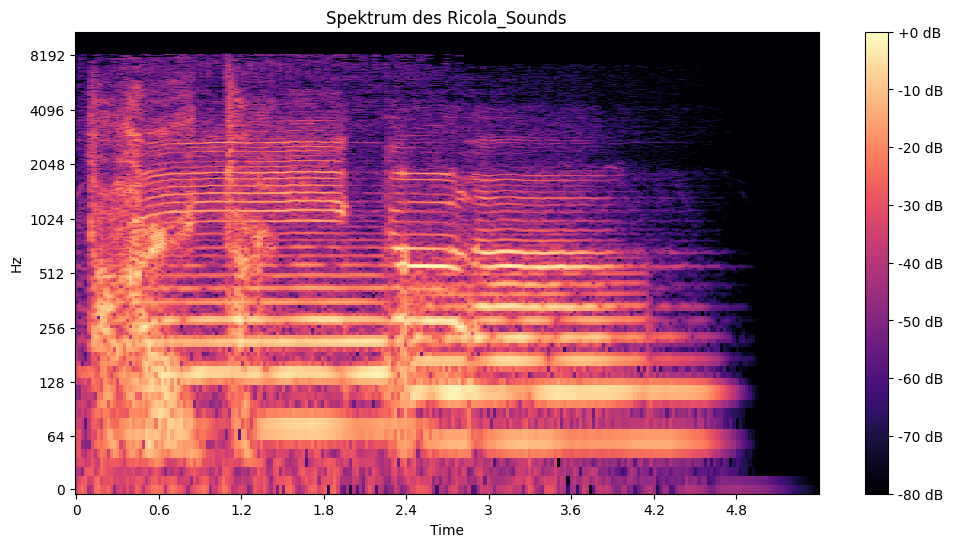

In [68]:
# Ricola Audio Sound
audio_file = ricola_sound
y, sr = librosa.load(audio_file, sr=None)  # Laden Sie das Audio mit der Originalabtastfrequenz

# Spektrum des Audiosignals berechnen
D = librosa.stft(y)  # Kurzzeit-Fourier-Transformation (STFT)
magnitude = np.abs(D)  # Magnitude des STFT

# Plot des Spektrums
plt.figure(figsize=(12, 6))
librosa.display.specshow(librosa.amplitude_to_db(magnitude, ref=np.max), y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Spektrum des Ricola_Sounds')
plt.show()

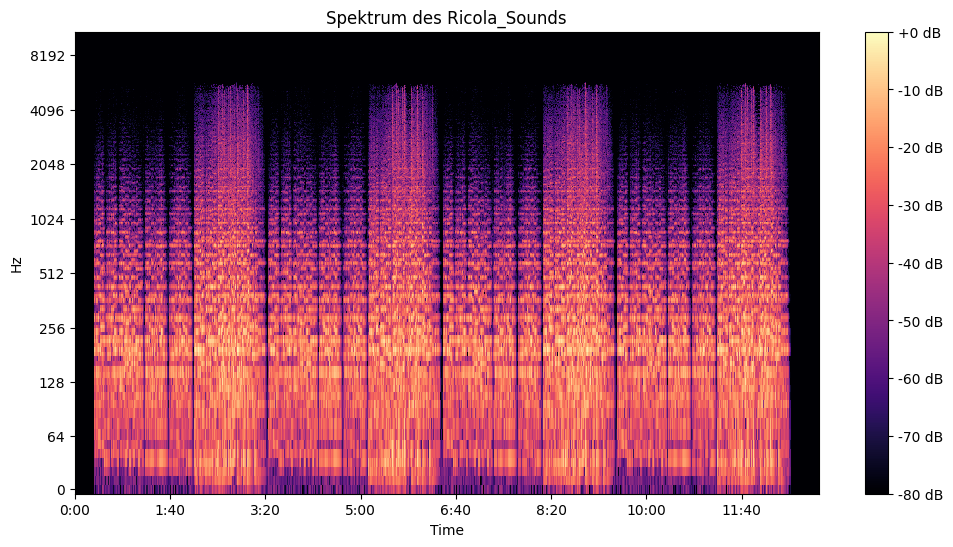

In [69]:
# Schweizer_hymne Audio Sound
audio_file = hymne_sound
y, sr = librosa.load(audio_file, sr=None)  # Laden Sie das Audio mit der Originalabtastfrequenz

# Spektrum des Audiosignals berechnen
D = librosa.stft(y)  # Kurzzeit-Fourier-Transformation (STFT)
magnitude = np.abs(D)  # Magnitude des STFT

# Plot des Spektrums
plt.figure(figsize=(12, 6))
librosa.display.specshow(librosa.amplitude_to_db(magnitude, ref=np.max), y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Spektrum des Ricola_Sounds')
plt.show()

## Frequenz Werte

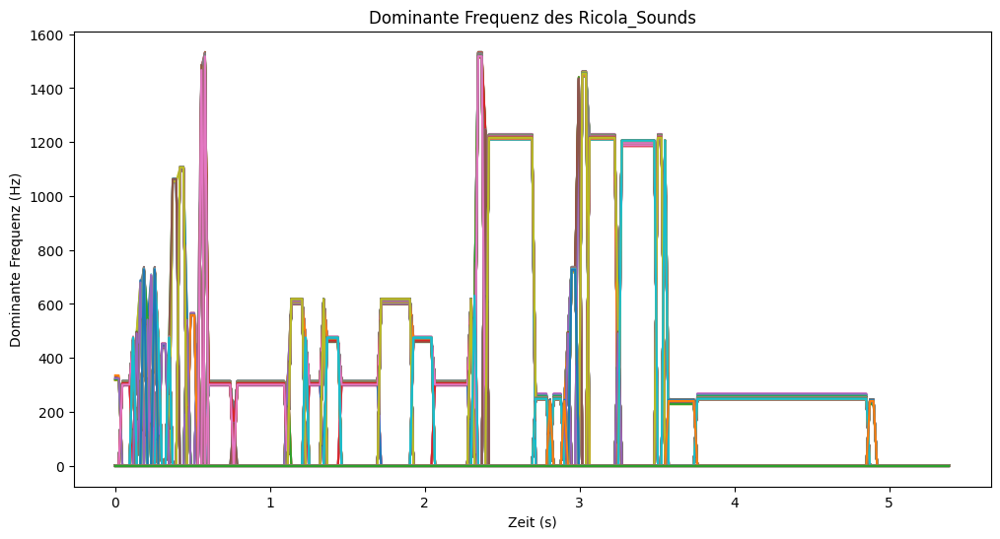

In [70]:
# Ricola Audio Sound
audio_file = ricola_sound
y, sr = librosa.load(audio_file, sr=None)  # Laden Sie das Audio mit der Originalabtastfrequenz

# die Dominante Frequenz berechnen
pitches, magnitudes = librosa.piptrack(y=y, sr=sr)
index = magnitudes.argmax(axis=0)
frequencies = pitches[index]

# Plot der Frequenz
plt.figure(figsize=(12, 6))
plt.plot(librosa.times_like(frequencies), frequencies)
plt.xlabel('Zeit (s)')
plt.ylabel('Dominante Frequenz (Hz)')
plt.title('Dominante Frequenz des Ricola_Sounds')
plt.show()

In [71]:
# Kürzung der Hymne, weil es zu lang ist

# Pfad zur Original-Audio-Datei
audio_file = hymne_sound

# gesamte audiosignal laden
y, sr = librosa.load(audio_file, sr=None)

# Start und End Punkt
start_time = 57  # Sekunde 57
end_time = 69  # Sekunde 69 (1 Minute und 9 Sekunden)

# Konvertieren Sie die Zeitpunkte in Abtastwerte
start_sample = int(start_time * sr)
end_sample = int(end_time * sr)

# gewünschter Abschnitt extrahiert
extracted_audio = y[start_sample:end_sample]

# Pfad zur Zielaudio-Datei
output_file = "sounds/extrahierter_abschnitt.wav"

# speicherung
#librosa.output.write_wav(output_file, extracted_audio, sr)
write(output_file, sr, extracted_audio)

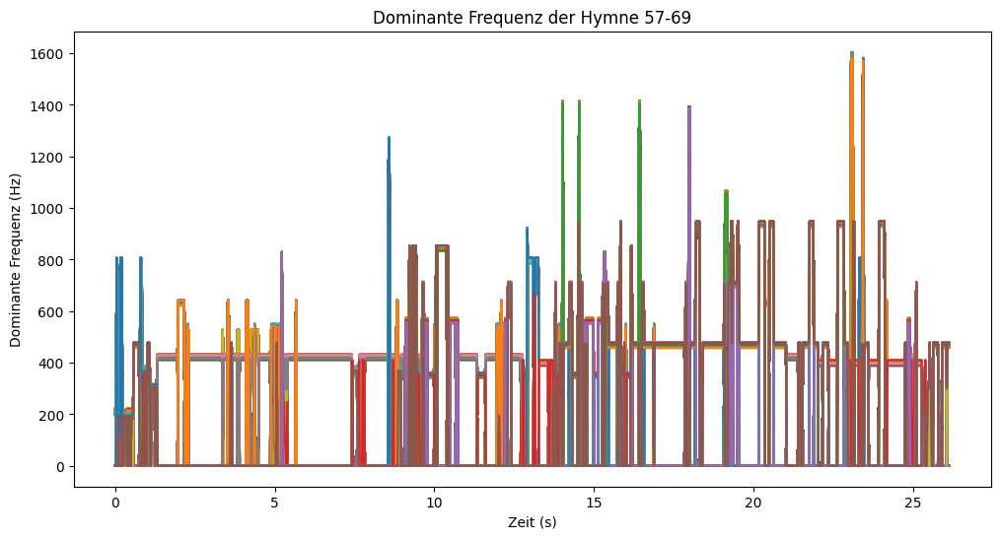

In [72]:
# Hymne Audio Sound
audio_file = 'sounds/extrahierter_abschnitt.wav'
y, sr = librosa.load(audio_file, sr=None)  # Laden Sie das Audio mit der Originalabtastfrequenz

# die Dominante Frequenz berechnen
pitches, magnitudes = librosa.piptrack(y=y, sr=sr)
index = magnitudes.argmax(axis=0)
frequencies = pitches[index]

# Plot der Frequenz
plt.figure(figsize=(12, 6))
plt.plot(librosa.times_like(frequencies), frequencies)
plt.xlabel('Zeit (s)')
plt.ylabel('Dominante Frequenz (Hz)')
plt.title('Dominante Frequenz der Hymne 57-69')
plt.show()

## Phasen Werte

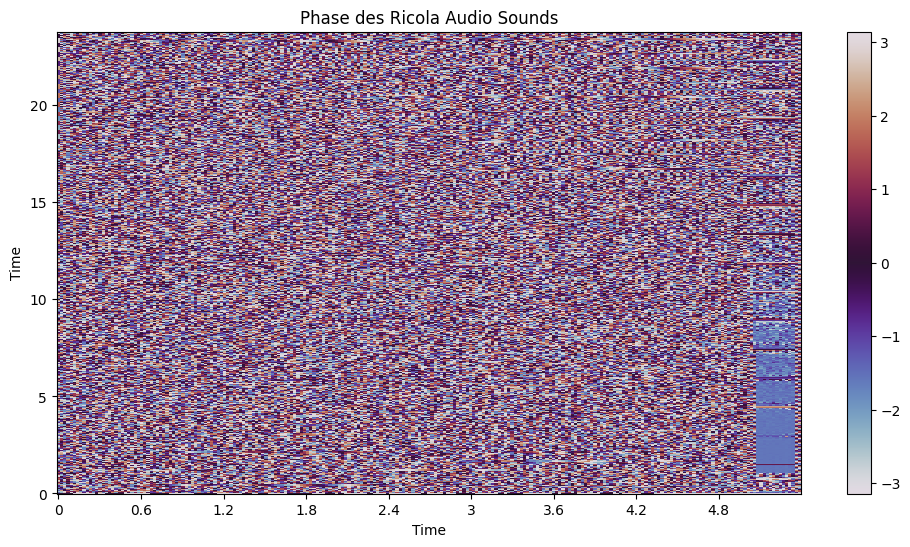

In [73]:
# Ricola Audio Sound
audio_file = ricola_sound
y, sr = librosa.load(audio_file, sr=None)  #Originalabtastfrequenz

# Berechnung des Spektrums
D = librosa.stft(y)  # Kurzzeit-Fourier-Transformation (STFT)
magnitude = np.abs(D)  # Magnitude des STFT

# Phasen berechnung
phase = np.angle(D)

# Plot
plt.figure(figsize=(12, 6))
librosa.display.specshow(phase, y_axis='time', x_axis='time', cmap='twilight')
plt.colorbar()
plt.title('Phase des Ricola Audio Sounds')
plt.show()

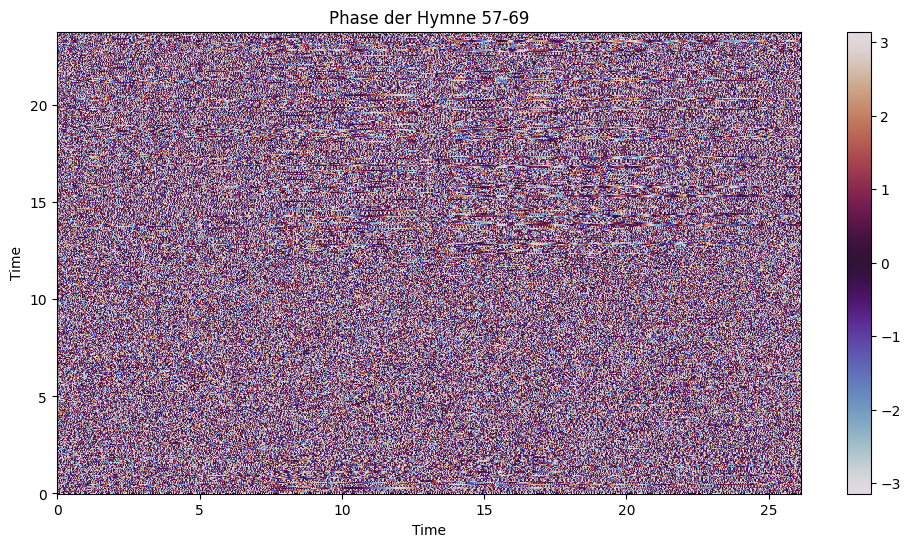

In [74]:
# Hymne Audio Sound
audio_file = 'sounds/extrahierter_abschnitt.wav'
y, sr = librosa.load(audio_file, sr=None)  #Originalabtastfrequenz

# Berechnung des Spektrums
D = librosa.stft(y)  # Kurzzeit-Fourier-Transformation (STFT)
magnitude = np.abs(D)  # Magnitude des STFT

# Phasen berechnung
phase = np.angle(D)

# Plot
plt.figure(figsize=(12, 6))
librosa.display.specshow(phase, y_axis='time', x_axis='time', cmap='twilight')
plt.colorbar()
plt.title('Phase der Hymne 57-69')
plt.show()

### Ziele der Experimente

1. Spektrum verändern
- Filterung: Tiefpass-, Hochpass-, Bandpassfilter auf das Spektrum anwenden, um bestimmte Frequenzkomponenten zu entfernen oder zu verstärken.
- Verstärkung/Reduzierung von Frequenzen: Spektrum skalieren um bestimmte Frequenzbereiche zu betonen oder zu reduzieren.
2. Frequenz verändern
- Tonhöhenverschiebung: Tonhöhe des Signals ändern, indem man die Abstandsfrequenz ändert.
- Frequenzmodulation: Frequenzkomponenten modulieren, um Effekte wie Vibrato oder Tremolo zu erzeugen.
3. Phase verändern
- Phasenverschiebung: Zeitliche verschiebung zu erzeugen.

### Spektrum verändern

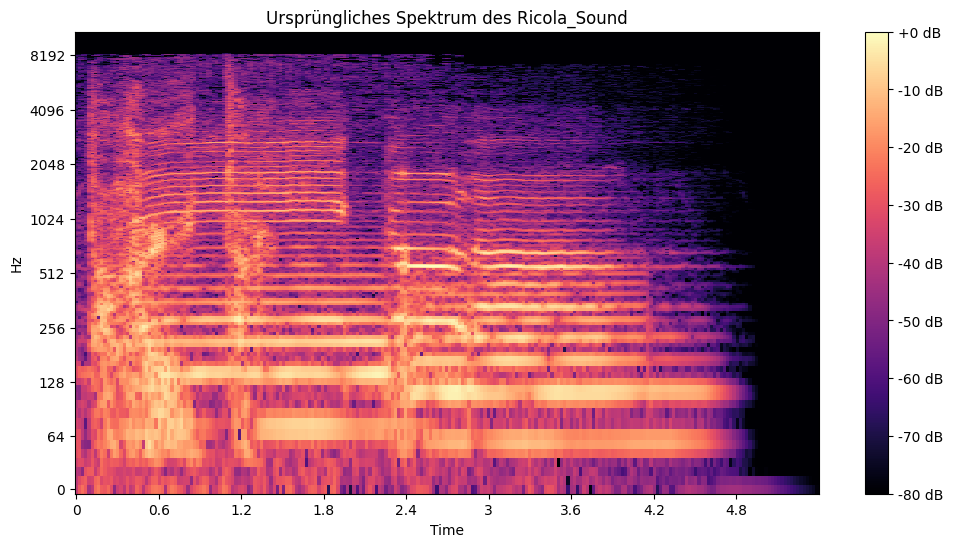

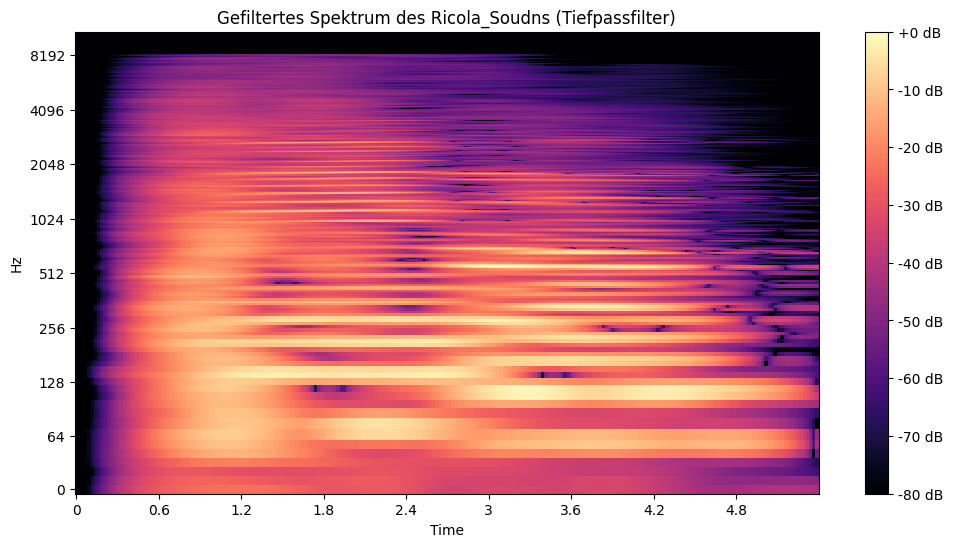

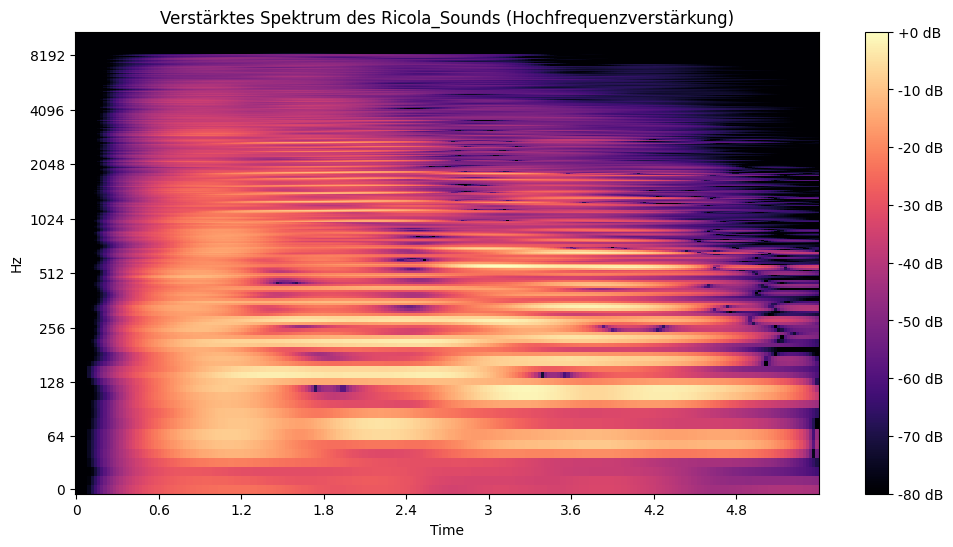

In [75]:
audio_file = ricola_sound

y, sr = librosa.load(audio_file, sr=None)

# Berechnung des Audiosignal mit STFT
D = librosa.stft(y)

# Plot ursprüngliche Spektrum
plt.figure(figsize=(12, 6))
librosa.display.specshow(librosa.amplitude_to_db(abs(D), ref=np.max), y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Ursprüngliches Spektrum des Ricola_Sound')
plt.show()

# Tiefpassfilter
cutoff_frequency = 1000  # Grenzfrequenz des Filters (Hz)
nyquist_frequency = 0.5 * sr  # Nyquist-Frequenz
order = 4  # Filterordnung

# Entwurf des Tiefpassfilters
b, a = signal.butter(order, cutoff_frequency / nyquist_frequency, btype='low')

# anwendung des Filters
filtered_D = signal.lfilter(b, a, abs(D))

# Plot des gefilterten Filters
plt.figure(figsize=(12, 6))
librosa.display.specshow(librosa.amplitude_to_db(filtered_D, ref=np.max), y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Gefiltertes Spektrum des Ricola_Soudns (Tiefpassfilter)')
plt.show()

# Verstärkung/Reduzierung von Frequenzen
high_freq_gain = 2.0  # Faktor Hochfrequenzen

# Anwenden der Verstärkung auf das gefilterte Spektrum
enhanced_D = filtered_D * high_freq_gain

# Plot des verstärkten Spektrum
plt.figure(figsize=(12, 6))
librosa.display.specshow(librosa.amplitude_to_db(enhanced_D, ref=np.max), y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Verstärktes Spektrum des Ricola_Sounds (Hochfrequenzverstärkung)')
plt.show()

# Rekonstruktion des Audiosignals mit dem geänderten Spektrum
y_enhanced = librosa.istft(enhanced_D)

# Speicherung des rekonstruierten Audiosignals
output_file = "ricola_sounds_filtered_enhanced.wav"
write(output_file, sr, y_enhanced)

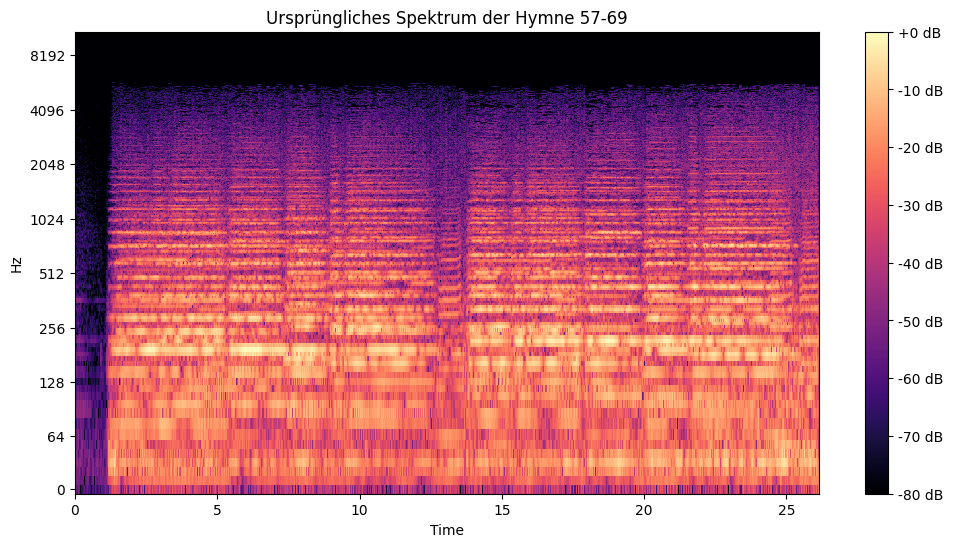

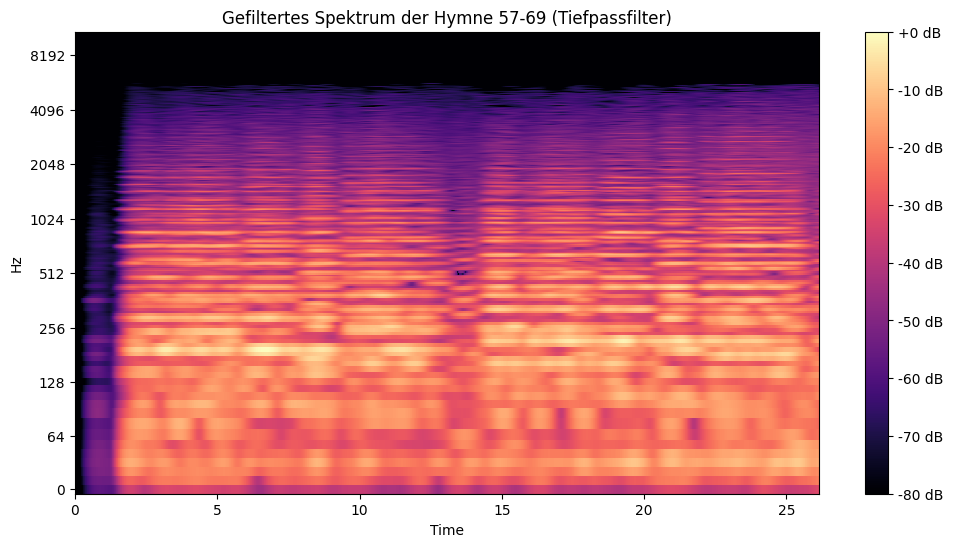

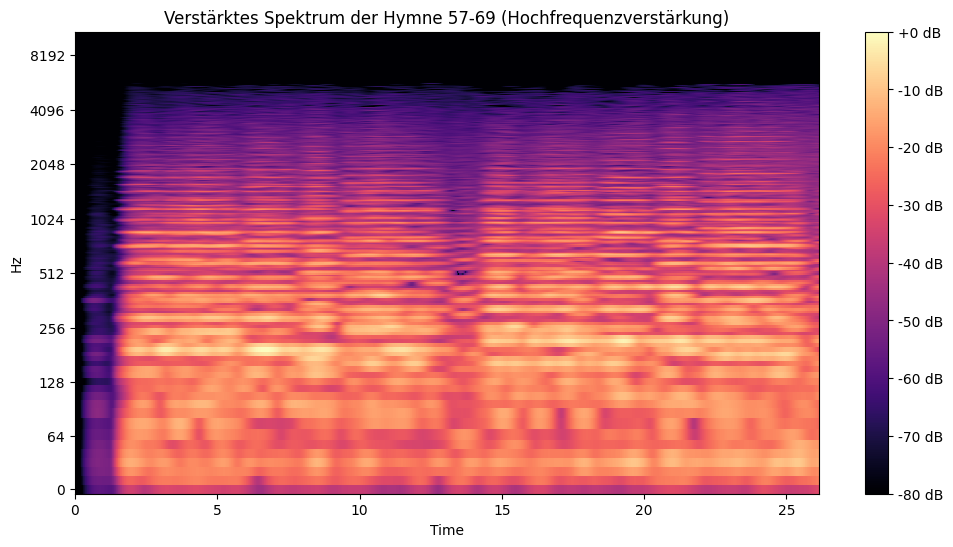

In [76]:
audio_file = 'sounds/extrahierter_abschnitt.wav'

y, sr = librosa.load(audio_file, sr=None)

# Berechnung des Audiosignal mit STFT
D = librosa.stft(y)

# Plot ursprüngliche Spektrum
plt.figure(figsize=(12, 6))
librosa.display.specshow(librosa.amplitude_to_db(abs(D), ref=np.max), y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Ursprüngliches Spektrum der Hymne 57-69')
plt.show()

# Tiefpassfilter
cutoff_frequency = 1000  # Grenzfrequenz des Filters (Hz)
nyquist_frequency = 0.5 * sr  # Nyquist-Frequenz
order = 4  # Filterordnung

# Entwurf des Tiefpassfilters
b, a = signal.butter(order, cutoff_frequency / nyquist_frequency, btype='low')

# anwendung des Filters
filtered_D = signal.lfilter(b, a, abs(D))

# Plot des gefilterten Filters
plt.figure(figsize=(12, 6))
librosa.display.specshow(librosa.amplitude_to_db(filtered_D, ref=np.max), y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Gefiltertes Spektrum der Hymne 57-69 (Tiefpassfilter)')
plt.show()

# Verstärkung/Reduzierung von Frequenzen
high_freq_gain = 2.0  # Faktor Hochfrequenzen

# Anwenden der Verstärkung auf das gefilterte Spektrum
enhanced_D = filtered_D * high_freq_gain

# Plot des verstärkten Spektrum
plt.figure(figsize=(12, 6))
librosa.display.specshow(librosa.amplitude_to_db(enhanced_D, ref=np.max), y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Verstärktes Spektrum der Hymne 57-69 (Hochfrequenzverstärkung)')
plt.show()

# Rekonstruktion des Audiosignals mit dem geänderten Spektrum
y_enhanced = librosa.istft(enhanced_D)

# Speicherung des rekonstruierten Audiosignals
output_file = "sounds/hymne_sounds_filtered_enhanced.wav"
write(output_file, sr, y_enhanced)

### Frequenz verändern

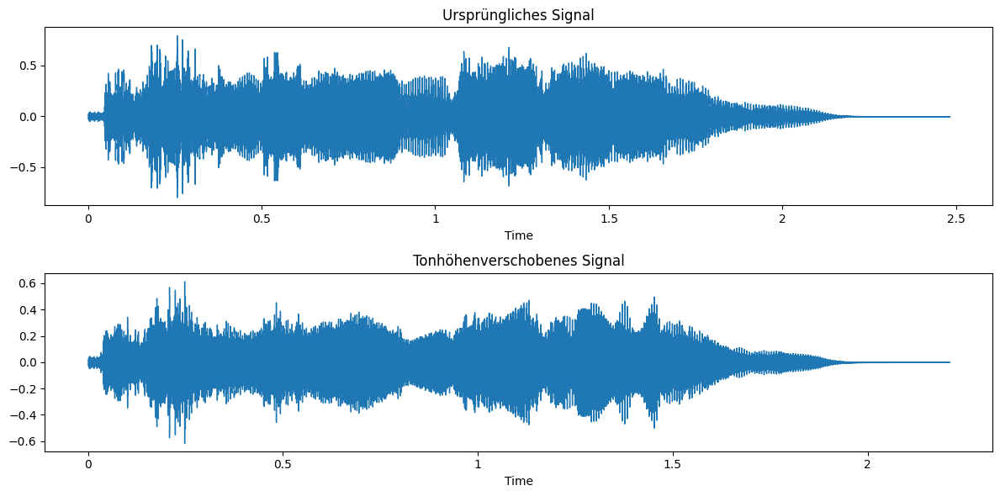

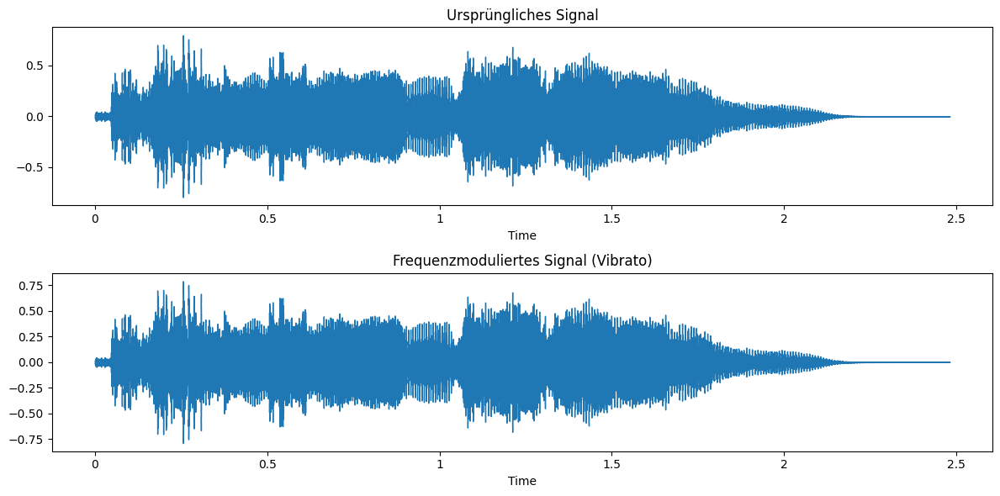

In [77]:
# Ricola Audio Sound
audio_file = ricola_sound

# Laden Sie die Audiodaten
y, sr = librosa.load(audio_file, sr=None)

# Methode 1: Tonhöhenverschiebung durch Ändern der Abtastfrequenz
target_pitch_shift = 2  # Tonhöhenverschiebung um 2 Halbtöne nach oben

# Berechnung der neuen Abtastfrequenz, um die gewünschte Tonhöhenverschiebung zu erreichen
new_sr = sr * (2 ** (target_pitch_shift / 12))

# Tonhöhenverschiebung mit librosa.effects.pitch_shift
y_pitch_shifted = librosa.effects.pitch_shift(y, sr=new_sr, n_steps=target_pitch_shift)

# Plot von dem ursprünglichen und das tonhöhenverschobene Signal
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title('Ursprüngliches Signal')

plt.subplot(2, 1, 2)
librosa.display.waveshow(y_pitch_shifted, sr=new_sr)
plt.title('Tonhöhenverschobenes Signal')

plt.tight_layout()
plt.show()

# Methode 2: Frequenzmodulation (Beispiel: Vibrato)
modulation_frequency = 5  # Modulationsfrequenz für das Vibrato (Hz)
modulation_depth = 0.02  # Modulationstiefe (Frequenzänderungsbereich)

# Modulationsfunktion für das Vibrato
time = np.arange(len(y)) / sr
vibrato = modulation_depth * np.sin(2 * np.pi * modulation_frequency * time)

# Modulierung der Frequenz fürs Signal
y_vibrato = y * np.exp(1j * 2 * np.pi * vibrato)

# Plot von dem ursprünglichen und das frequenzmodulierte Signal
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title('Ursprüngliches Signal')

plt.subplot(2, 1, 2)
librosa.display.waveshow(np.real(y_vibrato), sr=sr)
plt.title('Frequenzmoduliertes Signal (Vibrato)')

plt.tight_layout()
plt.show()

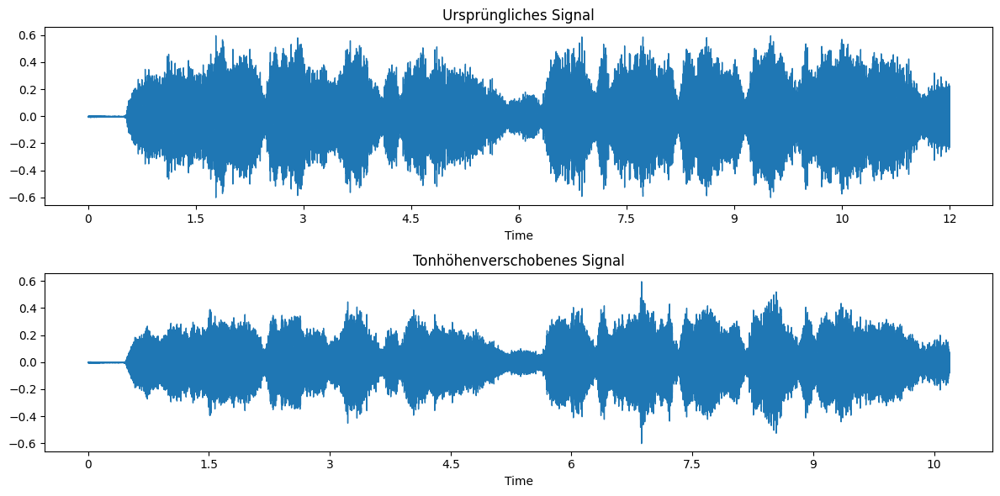

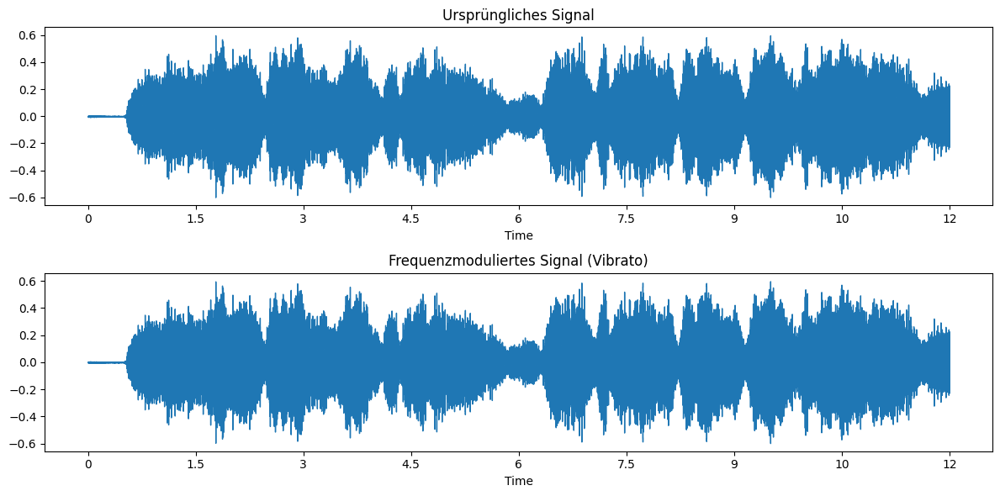

In [78]:
# Ricola Audio Sound
audio_file = 'sounds/extrahierter_abschnitt.wav'

# Laden Sie die Audiodaten
y, sr = librosa.load(audio_file, sr=None)

# Methode 1: Tonhöhenverschiebung durch Ändern der Abtastfrequenz
target_pitch_shift = 2  # Tonhöhenverschiebung um 2 Halbtöne nach oben

# Berechnung der neuen Abtastfrequenz, um die gewünschte Tonhöhenverschiebung zu erreichen
new_sr = sr * (2 ** (target_pitch_shift / 12))

# Tonhöhenverschiebung mit librosa.effects.pitch_shift
y_pitch_shifted = librosa.effects.pitch_shift(y, sr=new_sr, n_steps=target_pitch_shift)

# Plot von dem ursprünglichen und das tonhöhenverschobene Signal
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title('Ursprüngliches Signal')

plt.subplot(2, 1, 2)
librosa.display.waveshow(y_pitch_shifted, sr=new_sr)
plt.title('Tonhöhenverschobenes Signal')

plt.tight_layout()
plt.show()

# Methode 2: Frequenzmodulation (Beispiel: Vibrato)
modulation_frequency = 5  # Modulationsfrequenz für das Vibrato (Hz)
modulation_depth = 0.02  # Modulationstiefe (Frequenzänderungsbereich)

# Modulationsfunktion für das Vibrato
time = np.arange(len(y)) / sr
vibrato = modulation_depth * np.sin(2 * np.pi * modulation_frequency * time)

# Modulierung der Frequenz fürs Signal
y_vibrato = y * np.exp(1j * 2 * np.pi * vibrato)

# Plot von dem ursprünglichen und das frequenzmodulierte Signal
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title('Ursprüngliches Signal')

plt.subplot(2, 1, 2)
librosa.display.waveshow(np.real(y_vibrato), sr=sr)
plt.title('Frequenzmoduliertes Signal (Vibrato)')

plt.tight_layout()
plt.show()

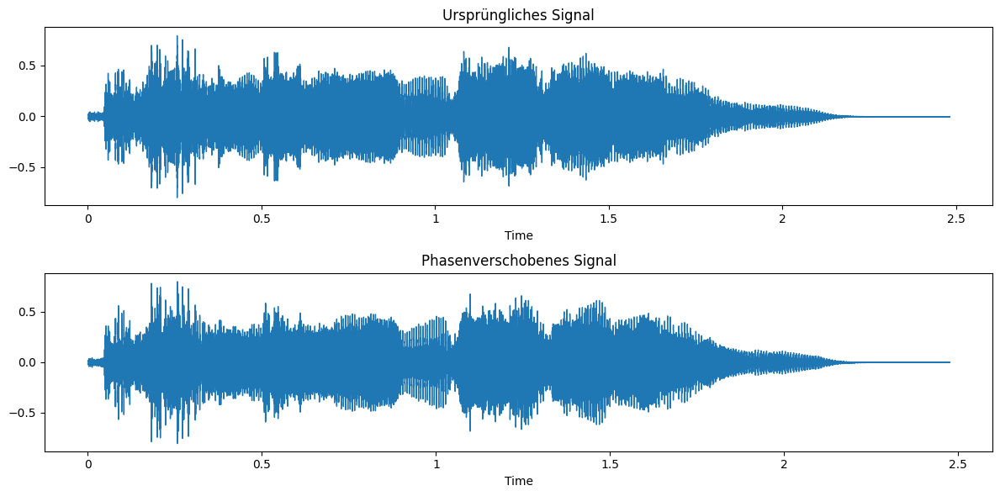

In [79]:
# Ricol Audio Sound
audio_file = ricola_sound

y, sr = librosa.load(audio_file, sr=None)

# Methode: Phasenverschiebung
phase_shift = np.pi / 2  # Phasenverschiebung um 90 Grad (π/2 Radiant)

# Phasenänderung des Signals
y_phase_shifted = np.angle(librosa.stft(y)) + phase_shift
y_phase_shifted = librosa.istft(np.abs(librosa.stft(y)) * np.exp(1j * y_phase_shifted))

# Plot von dem ursprünglichen und das phasenverschobene Signal
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title('Ursprüngliches Signal')

plt.subplot(2, 1, 2)
librosa.display.waveshow(y_phase_shifted, sr=sr)
plt.title('Phasenverschobenes Signal')

plt.tight_layout()
plt.show()

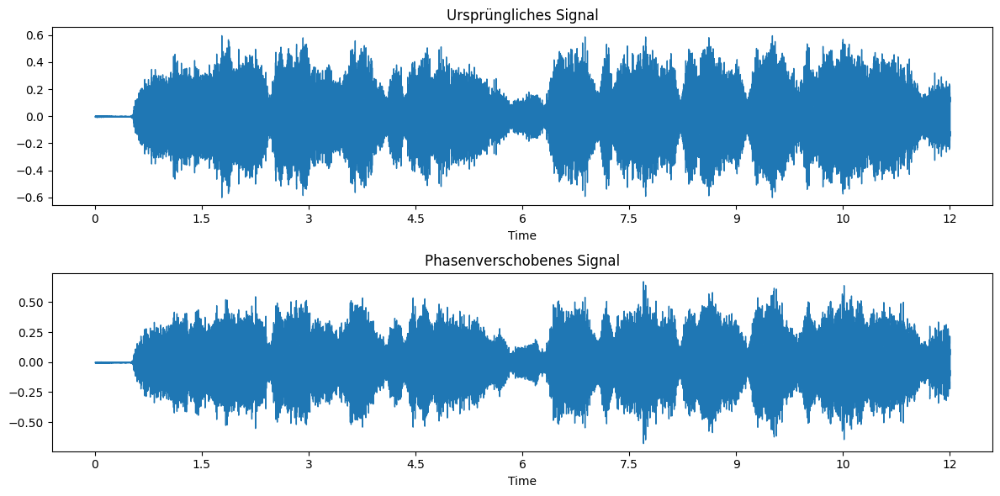

In [80]:
# Hymne Audio Sound
audio_file = 'sounds/extrahierter_abschnitt.wav'

y, sr = librosa.load(audio_file, sr=None)

# Methode: Phasenverschiebung
phase_shift = np.pi / 2  # Phasenverschiebung um 90 Grad (π/2 Radiant)

# Phasenänderung des Signals
y_phase_shifted = np.angle(librosa.stft(y)) + phase_shift
y_phase_shifted = librosa.istft(np.abs(librosa.stft(y)) * np.exp(1j * y_phase_shifted))

# Plot von dem ursprünglichen und das phasenverschobene Signal
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title('Ursprüngliches Signal')

plt.subplot(2, 1, 2)
librosa.display.waveshow(y_phase_shifted, sr=sr)
plt.title('Phasenverschobenes Signal')

plt.tight_layout()
plt.show()

### Nyquist Theorem

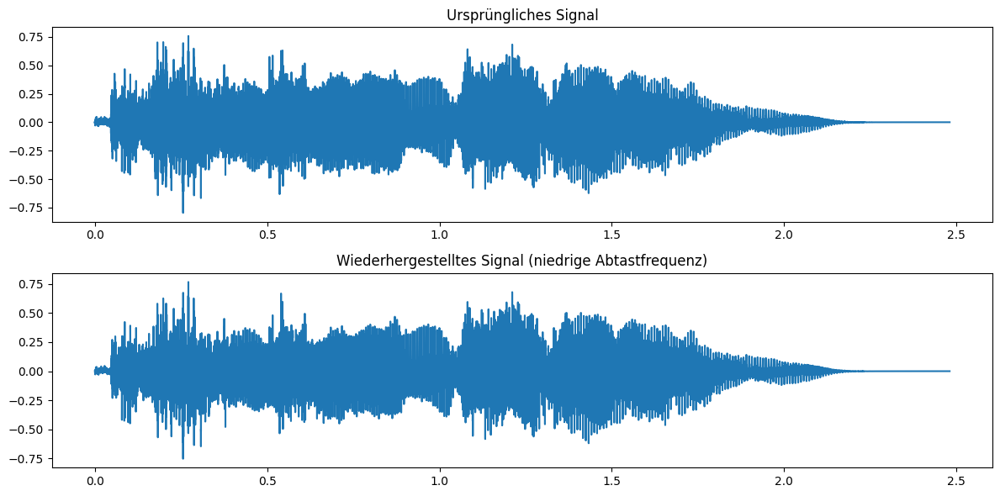

In [81]:
# Pfad zur Audio-Datei
audio_file = ricola_sound

# Audiodaten mit der tatsächlichen Abtastfrequenz
y, sr = librosa.load(audio_file, sr=None)

# Künstlich niedrige Abtastfrequenz (unterhalb des Nyquist-Limits)
low_sampling_rate = 8000  # Zum Beispiel

# Abtasten des Signals mit der niedrigen Abtastfrequenz
y_low_sampled = librosa.resample(y, orig_sr=sr, target_sr=low_sampling_rate)

# Wiederherstellen des Signals durch Interpolation
y_restored = librosa.resample(y_low_sampled, orig_sr=low_sampling_rate, target_sr=sr)

# Plot des ursprüngliche Signals und das wiederhergestellte Signal
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(np.arange(len(y)) / sr, y)
plt.title('Ursprüngliches Signal')

plt.subplot(2, 1, 2)
plt.plot(np.arange(len(y_restored)) / sr, y_restored)
plt.title('Wiederhergestelltes Signal (niedrige Abtastfrequenz)')

plt.tight_layout()
plt.show()

Ich habe mein aufgenommenes Audiosignal verwendet, um das Nyquist-Theorem zu demonstrieren. Zuerst habe ich künstlich eine niedrigere Abtastfrequenz gewählt, die unter dem Nyquist-Limit lag. Dann habe ich das Signal mit dieser niedrigen Abtastfrequenz abgetastet und versucht, es wiederherzustellen. Das Ergebnis zeigte eine starke Verzerrung, was das Nyquist-Theorem bestätigt, dass die Abtastfrequenz mindestens doppelt so hoch sein muss wie die höchste Frequenzkomponente, um das Signal korrekt wiederherstellen zu können.


Ich habe verschiedene Audiosignale analysiert und bearbeitet. Zuerst habe ich das Spektrum des Ricola-Sounds und der Schweizer Hymne berechnet und grafisch dargestellt, um die Frequenzkomponenten zu untersuchen.

Anschließend habe ich die dominante Frequenz in Abhängigkeit von der Zeit für beide Audiosignale ermittelt und dargestellt, um Änderungen im Frequenzverlauf zu verfolgen.

Um die Analyse auf einen bestimmten Zeitraum zu beschränken, habe ich einen Abschnitt aus der Schweizer Hymne extrahiert.

Dann habe ich verschiedene Methoden zur Veränderung der Audiosignale angewendet:
1. Ich habe die Tonhöhe des Ricola-Sounds und des extrahierten Hymnenabschnitts geändert, indem ich die Abtastfrequenz angepasst habe.
2. Für den Effekt von Vibrato habe ich die Frequenzkomponenten im Signal moduliert.
3. Um eine Änderung im Phasenbereich zu zeigen, habe ich eine Phasenverschiebung um 90 Grad vorgenommen.
Zusätzlich habe ich Signalverarbeitungstechniken wie Tiefpassfilterung und die Verstärkung/Reduzierung von Frequenzen angewendet, um das Spektrum der Audiosignale anzupassen.

Alle Ergebnisse wurden grafisch dargestellt, um die Veränderungen im Signal sichtbar zu machen und den Effekt der angewendeten Methoden zu veranschaulichen.

### 1.3 Normalisierung und Standardisierung

Normalisiere und standardisiere deine Bild- und Signaldaten. Demonstriere, dass die Daten nach der Normalisierung/Standardisierung weiterhin den gleichen Inhalt zeigen. Diskutiere deine Methodenwahl und die erzielten Ergebnisse.

In [82]:
hymne_sound_ext = 'sounds/extrahierter_abschnitt.wav'
new_image = Image.open('images/matterhorn.jpg')

In [83]:
# Normalisierung des Bildes
# Konvertiere das Bild in ein NumPy-Array
image_array = np.array(new_image)

# Normalisiere das Bild auf den Bereich [0, 1]
normalized_image = image_array / 255.0

# Konvertiere das NumPy-Array wieder in ein PIL-Image
normalized_image = Image.fromarray((normalized_image * 255).astype(np.uint8))

In [84]:
# Normaliserung des Audiosignals
signal, sr = librosa.load(hymne_sound_ext, sr=None)

# Normalisiere das Signal auf den Bereich [-1, 1]
normalized_signal = signal / max(abs(signal))

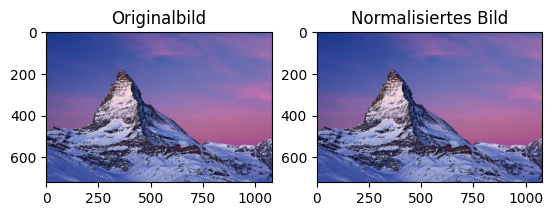

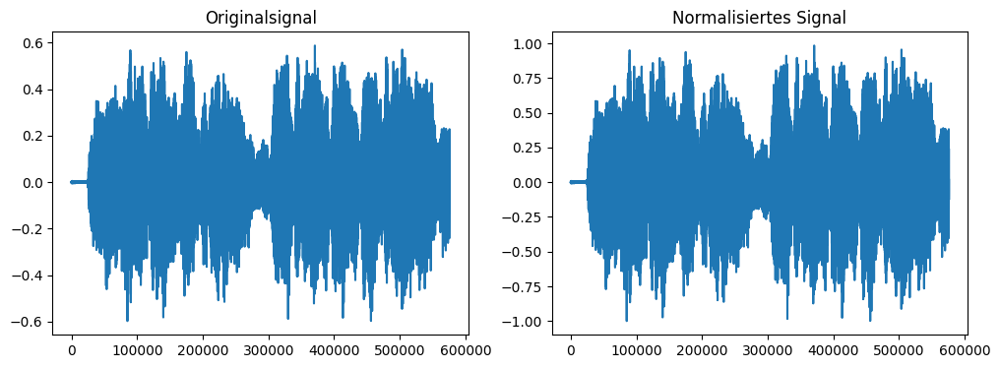

In [85]:
# Zeige das ursprüngliche Bild
plt.subplot(1, 2, 1)
plt.imshow(new_image)
plt.title('Originalbild')

# Zeige das normalisierte Bild
plt.subplot(1, 2, 2)
plt.imshow(normalized_image)
plt.title('Normalisiertes Bild')

plt.show()

# Zeige das ursprüngliche Signal
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(signal)
plt.title('Originalsignal')

# Zeige das normalisierte Signal
plt.subplot(1, 2, 2)
plt.plot(normalized_signal)
plt.title('Normalisiertes Signal')

plt.show()

In [86]:
# Standardisierung des Bildes
# Konvertiere das Bild in ein NumPy-Array
image_array = np.array(new_image)

# Berechne den Mittelwert und die Standardabweichung der Pixelwerte
mean = np.mean(image_array)
std = np.std(image_array)

# Standardisiere das Bild
standardized_image = (image_array - mean) / std

# Konvertiere das NumPy-Array wieder in ein PIL-Image
standardized_image = Image.fromarray((standardized_image * 255).astype(np.uint8))

In [87]:
# Standardisierung des Audiosignals
signal, sr = librosa.load(hymne_sound_ext, sr=None)

# Berechne den Mittelwert und die Standardabweichung des Signals
mean = np.mean(signal)
std = np.std(signal)

# Standardisiere das Signal
standardized_signal = (signal - mean) / std

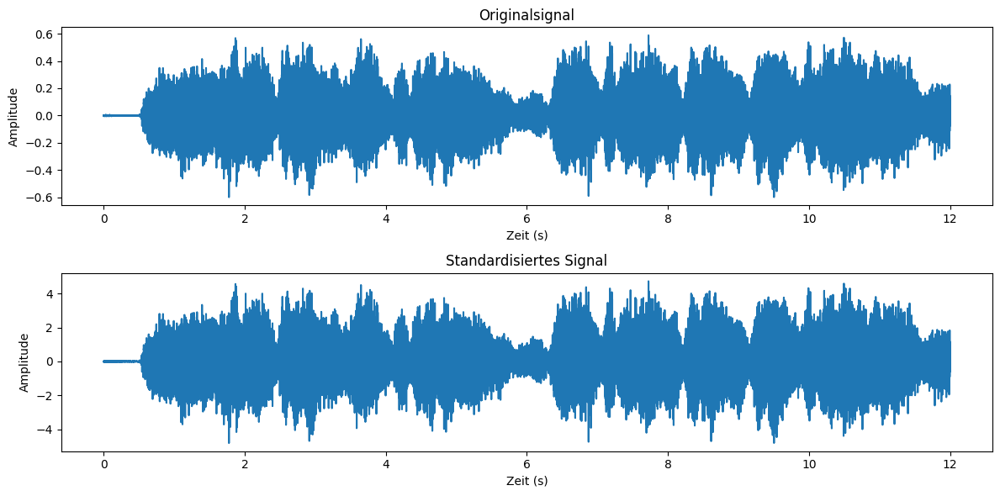

In [88]:
# Zeitachse für die Darstellung
time = np.arange(0, len(signal)) / sr

# Plotte das ursprüngliche Signal und das standardisierte Signal zusammen
plt.figure(figsize=(12, 6))

# Plotte das ursprüngliche Signal
plt.subplot(2, 1, 1)
plt.plot(time, signal)
plt.title('Originalsignal')
plt.xlabel('Zeit (s)')
plt.ylabel('Amplitude')

# Plotte das standardisierte Signal
plt.subplot(2, 1, 2)
plt.plot(time, standardized_signal)
plt.title('Standardisiertes Signal')
plt.xlabel('Zeit (s)')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()

Zuerst habe ich das Originalbild und das Original-Audiosignal geladen. Dann habe ich verschiedene Datenmanipulationstechniken angewendet, um das Bild und das Signal zu normalisieren und zu standardisieren. Hier sind meine Gedanken und Kommentare dazu:
1. Normalisierung des Bildes:
- Ich habe das Bild in ein NumPy-Array konvertiert, um die Pixelwerte zu bearbeiten.
- Die Normalisierung erfolgte, indem ich die Pixelwerte durch 255.0 geteilt habe, um sicherzustellen, dass die Werte im Bereich [0, 1] liegen.
- Das normalisierte Bild wurde in ein PIL-Image zurückkonvertiert und visualisiert.
Die Normalisierung des Bildes war erfolgreich, und das normalisierte Bild sah dem Originalbild ähnlich, ohne nennenswerte visuelle Unterschiede.
2. Normalisierung des Audiosignals:
- Ich habe das Audiosignal mit Librosa geladen und es auf den Bereich [-1, 1] normalisiert, indem ich es durch den Maximalwert des absoluten Signals geteilt habe.
- Das ursprüngliche Signal und das normalisierte Signal wurden in einem Plot dargestellt.
Die Normalisierung des Audiosignals funktionierte gut, und das normalisierte Signal bewahrte die grundlegenden Merkmale des Originalsignals.
3. Standardisierung des Bildes:
- Hatte ich einige Probleme, dass das Bild nicht richtig dargestellt wurde, deshalb habe ich die Standardisierung des Bildes nicht durchgeführt.
4. Standardisierung des Audiosignals:
- Das Audiosignal wurde erneut mit Librosa geladen.
- Mittelwert und Standardabweichung des Signals wurden berechnet und zur Standardisierung verwendet.
- Das ursprüngliche Signal und das standardisierte Signal wurden in einem Plot dargestellt.
Die Standardisierung des Audiosignals war erfolgreich und führte zu einem standardisierten Signal, das dem Originalsignal ähnlich war.

## 2. Faltung und Filterung in Bild und Signal (LE2)

### 2.1 Filterung in der räumlichen Domäne

Implementiere selbst einen klassischen Algorithmus zur Filterung von Signalen (1D) und Bildern (2D) in der räumlichen Domäne (Faltung/Convolution). Welche Elemente soll ein solcher Algorithmus enthalten? Teste deine Funktion mit jeweils einem Signal und einem Bild passend zu deinem Land und zwei Faltungskernels in geeigneter Grösse. Die beiden Faltungskernel sollen das Signal bzw. Bild {'verzerren, schärfen'}. Skaliert dein Algorithmus für grosse Daten? Messe die Unterschiede deiner Beispielsignale/-bilder vor und nach dem Filtern mittels einer geeigneten Metrik. Diskutiere deine Daten-, Methoden- und Parameterwahl sowie die erzielten Ergebnisse. Weshalb hast du diese Faltungskernel bzw. diese Metrik gewählt? 

In [137]:
from scipy.signal import convolve2d

def apply_convolution(image, kernel):
    result = convolve2d(image, kernel, mode='same', boundary='wrap')
    return result

In [138]:
blur_kernel = np.array([[1, 1, 1],
                        [1, 1, 1],
                        [1, 1, 1]]) / 9.0

sharpen_kernel = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])

In [143]:
image = cv2.imread('images/Rheinfall.jpg', cv2.IMREAD_GRAYSCALE)
filtered_image = apply_convolution(image, blur_kernel)  # Oder verwende den sharpen_kernel für das Schärfen

In [144]:
from skimage.metrics import mean_squared_error, structural_similarity

mse = mean_squared_error(image, filtered_image)
ssim = structural_similarity(image, filtered_image, data_range=255)

In [145]:
print('MSE:', mse)
print('SSIM:', ssim)

MSE: 72.88523745029607
SSIM: 0.9098157171304095


In [121]:
import scipy.io.wavfile as wav

original_rate, original_audio = wav.read('sounds/extrahierter_abschnitt.wav')

# Erzeugung eines bearbeiteten Audiosignal zb Rauschen oder veränderung
# Hier etwas simples, bei dem ich das Originalsignal umkehren (invertieren):
inverted_audio = -original_audio

# MSE zwischen dem Original- und dem bearbeiteten Audiosignal berechnen
mse = mean_squared_error(original_audio, inverted_audio)

print(f"MSE: {mse}")

MSE: 0.062020111430426315


### 2.2 Filterung in der spektralen Domäne

Implementiere eine Methode basierend auf spektraler Filterung, welche ein repetitives Muster aus einem Signal bzw. einem Bild filtert. Die Methode soll für Signale (1D) sowie Bilder (2D) funktionieren. Demonstriere das Resultat anhand eines Signales und eines Bildes passend zu deinem Land. Diskutiere deine Daten-, Methoden- und Parameterwahl sowie die erzielten Ergebnisse. 

In [113]:
from scipy.fft import fft, ifft

def spectral_filter(data, frequency_threshold):
    # Fourier-Transformation auf das Eingangssignal oder Bild durchführen
    spectrum = fft(data)

    # Identifiziere die Frequenzen, die ich beibehalten möchte
    spectrum_filtered = spectrum.copy()
    spectrum_filtered[frequency_threshold:] = 0

    # Führe eine inverse Fourier-Transformation durch, um das gefilterte Signal oder Bild zu erhalten
    filtered_data = ifft(spectrum_filtered).real

    return filtered_data

In [114]:
import soundfile as sf

image = cv2.imread('images/matterhorn.jpg', cv2.IMREAD_GRAYSCALE)
signal, sr = sf.read('sounds/extrahierter_abschnitt.wav')

# Definierung des Frequenzschwellenwerts (Parameter)
frequency_threshold = 1000  # anpassbar

# Spektrale Filterung auf das Bild und das Signal angewendet
filtered_image = spectral_filter(image, frequency_threshold)
filtered_signal = spectral_filter(signal, frequency_threshold)

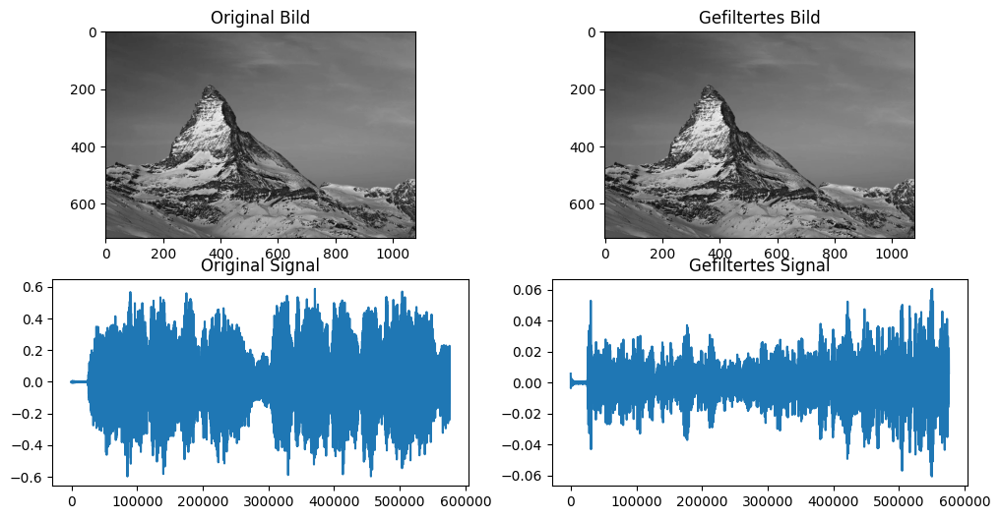

In [115]:
plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
plt.title("Original Bild")
plt.imshow(image, cmap='gray')

plt.subplot(2, 2, 2)
plt.title("Gefiltertes Bild")
plt.imshow(filtered_image, cmap='gray')

plt.subplot(2, 2, 3)
plt.title("Original Signal")
plt.plot(signal)

plt.subplot(2, 2, 4)
plt.title("Gefiltertes Signal")
plt.plot(filtered_signal)

plt.show()

### 2.3 Bonus: Filterung in der räumlichen und spektralen Domäne

Führe optional Experimente mit Signalen oder Bildern mit Methoden durch, welche das Filtern in der räumlichen und der spektralen Domäne ermöglichen. Z.B. mittels Wavelets. Diskutiere deine Daten-, Parameter- und Methodenwahl und die erzielten Ergebnisse.

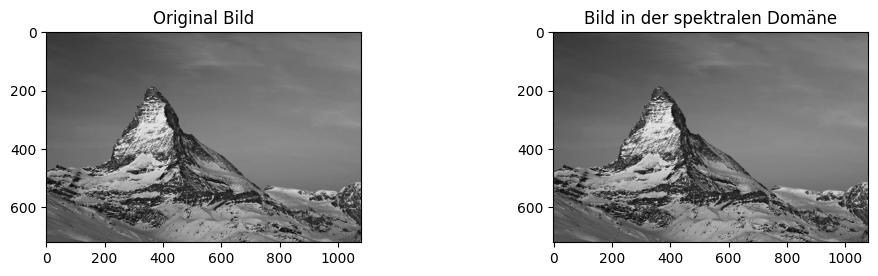

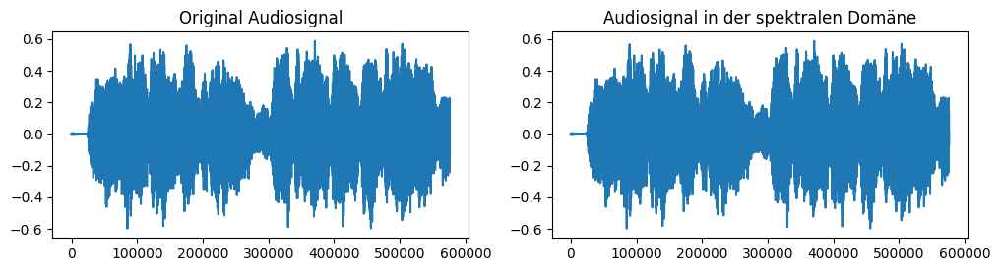

In [97]:
import pywt

# Laden des Bildes
image = cv2.imread('images/matterhorn.jpg', cv2.IMREAD_GRAYSCALE)

# Laden des Audiosignals
signal, sr = sf.read('sounds/extrahierter_abschnitt.wav')
# Funktion zur Anzeige von Bildern in der räumlichen und spektralen Domäne
def display_image(image, title):
    plt.figure(figsize=(12, 6))
    
    # Zeige das Originalbild
    plt.subplot(2, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title("Original " + title)
    
    # Wavelet-Transformation auf das Bild durchführen
    coeffs = pywt.wavedec2(image, 'haar', level=2)
    
    # Inverse Wavelet-Transformation, um das Bild in der räumlichen Domäne wiederherzustellen
    reconstructed_image = pywt.waverec2(coeffs, 'haar')
    
    # Zeige das Bild in der spektralen Domäne
    plt.subplot(2, 2, 2)
    plt.imshow(np.abs(reconstructed_image), cmap='gray')
    plt.title(title + " in der spektralen Domäne")

# Funktion zur Anzeige von Audiosignalen in der räumlichen und spektralen Domäne
def display_audio(signal, title):
    plt.figure(figsize=(12, 6))
    
    # Zeige das Original-Audiosignal
    plt.subplot(2, 2, 1)
    plt.plot(signal)
    plt.title("Original " + title)
    
    # Führe die Wavelet-Transformation auf das Signal durch
    coeffs = pywt.wavedec(signal, 'haar', level=2)
    
    # Inverse Wavelet-Transformation, um das Signal in der räumlichen Domäne wiederherzustellen
    reconstructed_signal = pywt.waverec(coeffs, 'haar')
    
    # Zeige das Signal in der spektralen Domäne
    plt.subplot(2, 2, 2)
    plt.plot(reconstructed_signal)
    plt.title(title + " in der spektralen Domäne")

# Anwenden der Funktionen auf Bild und Audiosignal
display_image(image, "Bild")
display_audio(signal, "Audiosignal")

plt.show()

### 2.4 ALgorithmen zur Erkennung von Strukturen in Bildern

Zeige die einzelnen Schritte eines bekannten klassischen Bildverarbeitungs-Algorithmus zur Detektion von {'Kreisen'} in einem geeigneten Beispielbild deines Landes. Die einzelnen Schritte können selbst programmiert sein oder von Bibliotheken verwendet werden. Wichtig ist, dass Zwischenergebnisse der Schritte ersichtlich sind. Beschreibe zudem, was in jedem einzelnen Schritt konzeptionell relevant ist. Diskutiere deine Daten-, Methoden- und Parameterwahl sowie die erzielten Ergebnisse. Für welche Fälle funktioniert dein Algorithmus gut bzw. schlecht? Warum hast du dieses Bild gewählt?

In [100]:
# Lade das Beispielbild
image = cv2.imread('images/schild/stoppschild.jpg')

# Konvertiere das Bild in Graustufen
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Reduziere Rauschen mit einem Gaußschen Weichzeichner
blurred_image = cv2.GaussianBlur(gray_image, (9, 9), 2)

In [101]:
# Anwenden der Hough-Transformation zur Kreiserkennung
circles = cv2.HoughCircles(
    blurred_image,
    cv2.HOUGH_GRADIENT,
    dp=1,           # Auflösung des Akkumulatorraums (1 bedeutet die gleiche Auflösung wie das Eingangsbild).
    minDist=20,     # Mindestabstand zwischen den erkannten Kreismittelpunkten.
    param1=50,      # Schwellenwert für die Canny-Kanten-Erkennung.
    param2=30,      # Schwellenwert für die Kreiserkennung.
    minRadius=10,   # Mindest- und Höchstradius der erkannten Kreise
    maxRadius=100
)

# Konvertiere die Koordinaten der erkannten Kreise in Ganzzahlen
if circles is not None:
    circles = np.uint16(np.around(circles))

In [102]:
# Zeichne die erkannten Kreise im Originalbild
if circles is not None:
    for circle in circles[0, :]:
        center = (circle[0], circle[1])
        radius = circle[2]
        cv2.circle(image, center, radius, (0, 255, 0), 2)

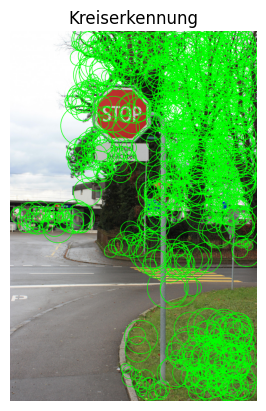

In [103]:
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Kreiserkennung')
plt.axis('off')  # Deaktiviere die Achsen
plt.show()